# Dataset Info

We have a dataset in which there are details of a bank's customers and the target variable is a binary variable reflecting the fact whether the customer left the bank (closed his account) or he continues to be a customer.

The features in the given dataset are:
- **rownumber:** Row Numbers from 1 to 10000.
- **customerid:** A unique ID that identifies each customer.
- **surname:** The customer’s surname.
- **creditscore:** A credit score is a number between 300–850 that depicts a consumer's creditworthiness.
- **geography:** The country from which the customer belongs to.
- **Gender:** The customer’s gender: Male, Female
- **Age:** The customer’s current age, in years, at the time of being customer.
- **tenure:** The number of years for which the customer has been with the bank.
- **balance:** Bank balance of the customer.
- **numofproducts:** the number of bank products the customer is utilising.
- **hascrcard:** The number of credit cards given to the customer by the bank.
- **isactivemember:** Binary Flag for indicating if the client is active or not with the bank before the moment where the client exits the company (recorded in the variable "exited")
- **exited:** Binary flag 1 if the customer closed account with bank and 0 if the customer is retained.

# Improt Libraries & Data

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

plt.rcParams["figure.figsize"] = (10, 6)

sns.set_style("whitegrid")
pd.set_option("display.float_format", lambda x: "%.3f" % x)
pd.set_option("display.max_columns", None)

In [2]:
df =pd.read_csv('Churn_Modelling.csv')

# Exploratory Data Analysis and Visualization

1. Implement basic steps to see how is your data looks like
2. Check for missing values
3. Drop the features that not suitable for modelling
4. Implement basic visualization steps such as histogram, countplot, heatmap
5. Convert categorical variables to dummy variables

In [3]:
df.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.000,1,1,1,101348.880,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.860,1,0,1,112542.580,0
2,3,15619304,Onio,502,France,Female,42,8,159660.800,3,1,0,113931.570,1
3,4,15701354,Boni,699,France,Female,39,1,0.000,2,0,0,93826.630,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.820,1,1,1,79084.100,0


In [4]:
df.shape

(10000, 14)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   RowNumber        10000 non-null  int64  
 1   CustomerId       10000 non-null  int64  
 2   Surname          10000 non-null  object 
 3   CreditScore      10000 non-null  int64  
 4   Geography        10000 non-null  object 
 5   Gender           10000 non-null  object 
 6   Age              10000 non-null  int64  
 7   Tenure           10000 non-null  int64  
 8   Balance          10000 non-null  float64
 9   NumOfProducts    10000 non-null  int64  
 10  HasCrCard        10000 non-null  int64  
 11  IsActiveMember   10000 non-null  int64  
 12  EstimatedSalary  10000 non-null  float64
 13  Exited           10000 non-null  int64  
dtypes: float64(2), int64(9), object(3)
memory usage: 1.1+ MB


In [6]:
print('''
Number of Duplicate is   : {}
Number of Null-Values is : {}'''.format(df.duplicated().sum(),df.isna().sum().sum()))


Number of Duplicate is   : 0
Number of Null-Values is : 0


In [7]:
print('Shape Before Drop: ',df.shape)
df.drop(['RowNumber','CustomerId','Surname'],axis=1, inplace=True)
print('Shape After Drop: ',df.shape)

Shape Before Drop:  (10000, 14)
Shape After Drop:  (10000, 11)


### Breaking Down the Object columns 
In this section, we conducted an initial analysis of the dataset to gain insights into its structure and content. We explored various aspects, including the data's dimensions, data types, and initial statistics. Additionally, we visualized key attributes to understand their distributions and relationships. The purpose of this initial analysis is to lay the foundation for more in-depth exploration, feature engineering, and model building. We identified object columns  "Geography," and "Gender" for further investigation, which can provide valuable insights into customer demographics and behaviors

In [8]:
df.select_dtypes(include=['object'])

,Geography,Gender
0,France,Female
1,Spain,Female
2,France,Female
3,France,Female
4,Spain,Female
...,...,...
9995,France,Male
9996,France,Male
9997,France,Female
9998,Germany,Male


In [9]:
df.select_dtypes(include=['object']).nunique() 

Geography    3
Gender       2
dtype: int64

In [10]:
fig1 = px.pie(df, names='Gender', title='Gender Distribution')
fig1.show()

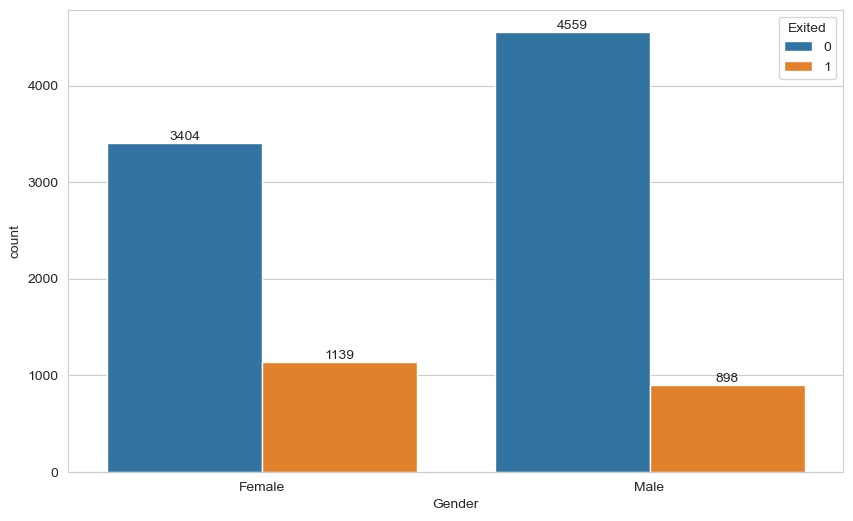

In [11]:
ax=sns.countplot(data= df , x='Gender',hue='Exited')
for i in range(df['Exited'].nunique()):
    ax.bar_label(ax.containers[i], label_type='edge')
# we can see that the majorty of who left the bank are females 

In [12]:
fig = px.histogram(df, x='Gender', color='Exited', title='Gender with Exited')
fig.update_traces(texttemplate='%{y}', textposition='outside')
fig.show()

In [13]:

fig3 = px.box(df, x='Gender', y='Age', color='Exited', title='Age Distribution by Gender and Exit Status')
fig3.show()

In [14]:
df.groupby('Gender')['Exited'].value_counts().unstack()

Exited,0,1
Gender,,
Female,3404,1139
Male,4559,898


In [15]:
fig1 = px.pie(df, names='Geography', title='Geography Distribution')
fig1.show()

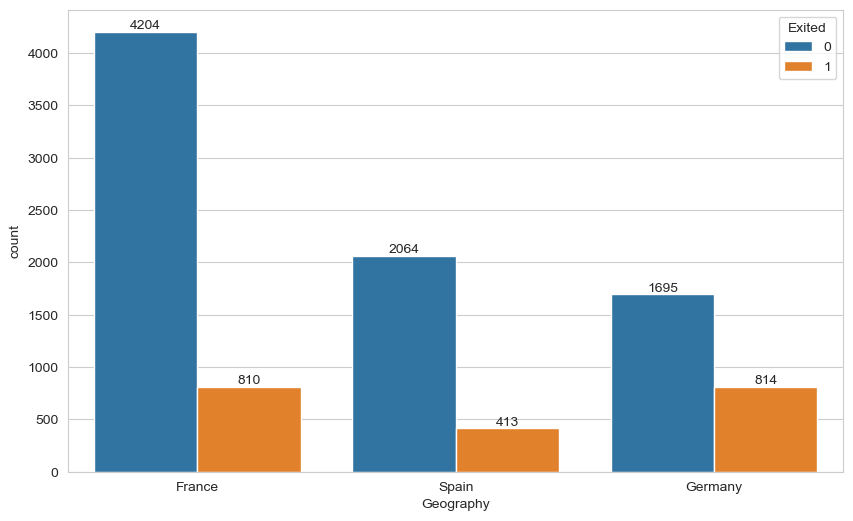

In [16]:
ax=sns.countplot(data= df , x='Geography',hue='Exited')
for i in range(df['Exited'].nunique()):
    ax.bar_label(ax.containers[i], label_type='edge')
# We can see that France and germany has the majority of who Exited the bank and also note that Germany has less then half of France regarding the accounts  

In [17]:
fig3 = px.box(df, x='Geography', y='Age', color='Exited', title='Age Distribution by Geography and Exit Status')
fig3.show()
# We can see some outliers in ages in diffrent Geography location
# and most outliers are on those who stayed in the bank  

In [18]:

df.groupby('Geography')['Exited'].value_counts().unstack()

Exited,0,1
Geography,,
France,4204,810
Germany,1695,814
Spain,2064,413


### Analysis of Integer and Floating-Point Columns:
In the following section, we shift our focus to the analysis of numerical attributes, specifically the integer (int) and floating-point (float) columns in the dataset. These columns often hold critical information related to customer behavior and financial characteristics.

In [19]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
CreditScore,10000.000,650.529,96.653,350.000,584.000,652.000,718.000,850.000
Age,10000.000,38.922,10.488,18.000,32.000,37.000,44.000,92.000
Tenure,10000.000,5.013,2.892,0.000,3.000,5.000,7.000,10.000
Balance,10000.000,76485.889,62397.405,0.000,0.000,97198.540,127644.240,250898.090
NumOfProducts,10000.000,1.530,0.582,1.000,1.000,1.000,2.000,4.000
HasCrCard,10000.000,0.706,0.456,0.000,0.000,1.000,1.000,1.000
IsActiveMember,10000.000,0.515,0.500,0.000,0.000,1.000,1.000,1.000
EstimatedSalary,10000.000,100090.240,57510.493,11.580,51002.110,100193.915,149388.247,199992.480
Exited,10000.000,0.204,0.403,0.000,0.000,0.000,0.000,1.000


In [20]:
df.select_dtypes(exclude='object').head()

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,619,42,2,0.000,1,1,1,101348.880,1
1,608,41,1,83807.860,1,0,1,112542.580,0
2,502,42,8,159660.800,3,1,0,113931.570,1
3,699,39,1,0.000,2,0,0,93826.630,0
4,850,43,2,125510.820,1,1,1,79084.100,0


In [21]:
df.select_dtypes(exclude='object').columns

Index(['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'Exited'],
      dtype='object')

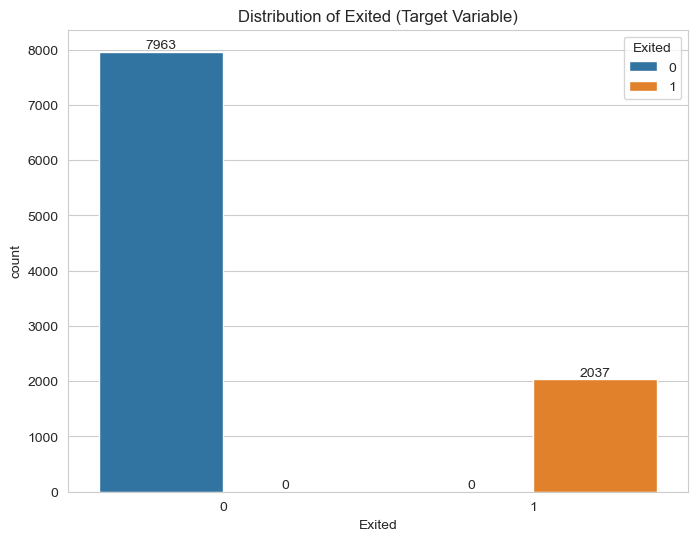

In [22]:
plt.figure(figsize=(8, 6))
ax = sns.countplot(data=df, x='Exited', hue='Exited')
plt.title('Distribution of Exited (Target Variable)')
for i in range(df['Exited'].nunique()):
    ax.bar_label(ax.containers[i], label_type='edge')

plt.show()


In [23]:
df.groupby('IsActiveMember')['Exited'].value_counts().unstack()

Exited,0,1
IsActiveMember,,
0,3547,1302
1,4416,735


In [24]:
dfff = pd.DataFrame({'Category': ['Active Members', 'Inactive Members'],
                     'Count': [df[df['IsActiveMember'] == 1].shape[0], df[df['IsActiveMember'] == 0].shape[0]]})

fig = px.pie(dfff, names='Category', values='Count', title='Ratio of Active vs. Inactive Members',
             hole=0.4, color_discrete_sequence=px.colors.qualitative.Set1)
fig.show()


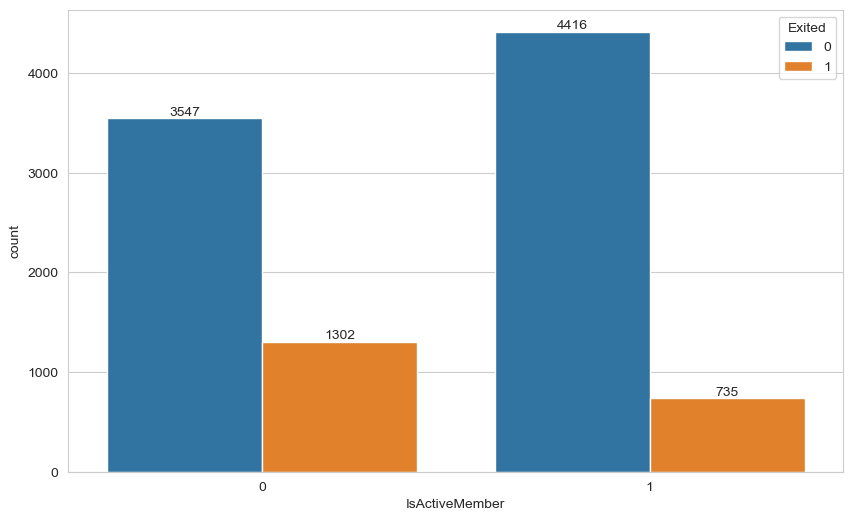

In [25]:
ax=sns.countplot(data= df , x='IsActiveMember',hue='Exited')
for i in range(df['Exited'].nunique()):
    ax.bar_label(ax.containers[i], label_type='edge')
# We can see that most who left the bank are who is not Active So we can inhance the custmoer experiance so we can reduce who left 

In [26]:
df.groupby('HasCrCard')['Exited'].value_counts().unstack()

Exited,0,1
HasCrCard,,
0,2332,613
1,5631,1424


In [27]:
import plotly.express as px

dfff = pd.DataFrame({'Category': ['Has Credit Card', 'No Credit Card'],
                     'Count': [df[df['HasCrCard'] == 1].shape[0], df[df['HasCrCard'] == 0].shape[0]]})

fig = px.pie(dfff, names='Category', values='Count', title='Ratio of Having vs. Not Having Credit Card',
             hole=0.4, color_discrete_sequence=px.colors.qualitative.Set1)
fig.show()


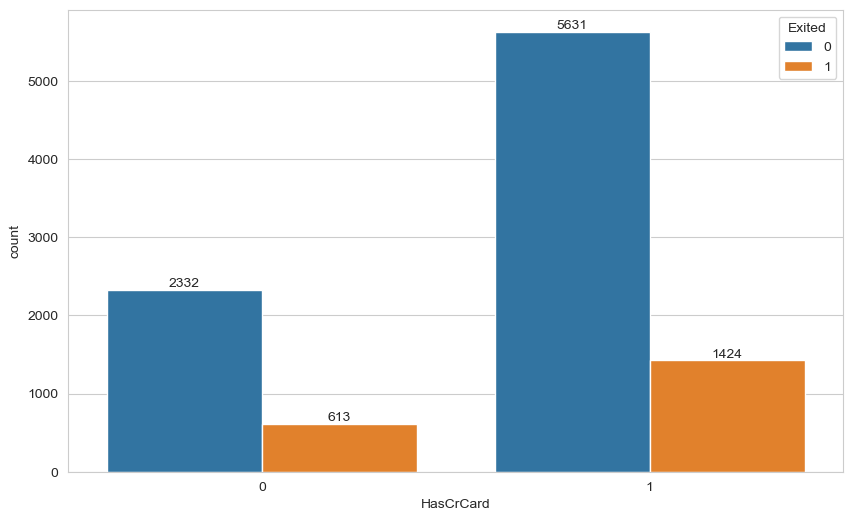

In [28]:
ax=sns.countplot(data= df , x='HasCrCard',hue='Exited')
for i in range(df['Exited'].nunique()):
    ax.bar_label(ax.containers[i], label_type='edge')
# For some Reason most of the customers who has a card credit left the bank

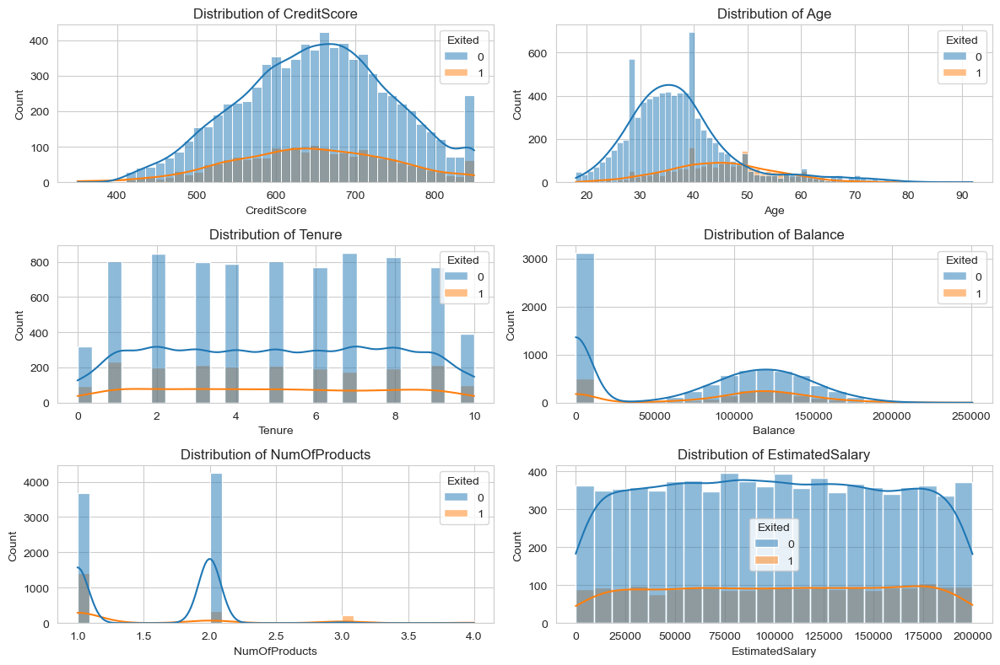

In [29]:
features = ['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'EstimatedSalary']

plt.figure(figsize=(12, 8))

for i, feature in enumerate(features, 1):
    plt.subplot(3, 2, i)  
    sns.histplot(data=df, x=feature, hue='Exited', kde=True)
    plt.title(f'Distribution of {feature}')

plt.tight_layout()
plt.show()
# we can see that most off them are normaly distibution , and there is like the age is right skew 

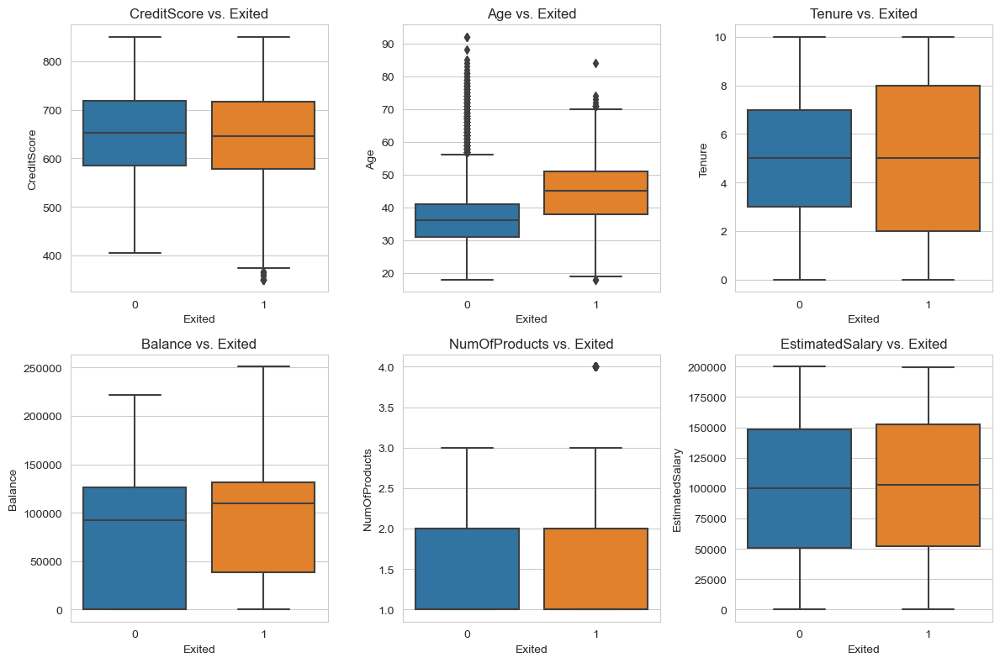

In [30]:
plt.figure(figsize=(12, 8))

for i, feature in enumerate(features, 1):
    plt.subplot(2, 3, i) 
    sns.boxplot(data=df, x='Exited', y=feature)
    plt.title(f'{feature} vs. Exited')

plt.tight_layout()
plt.show()


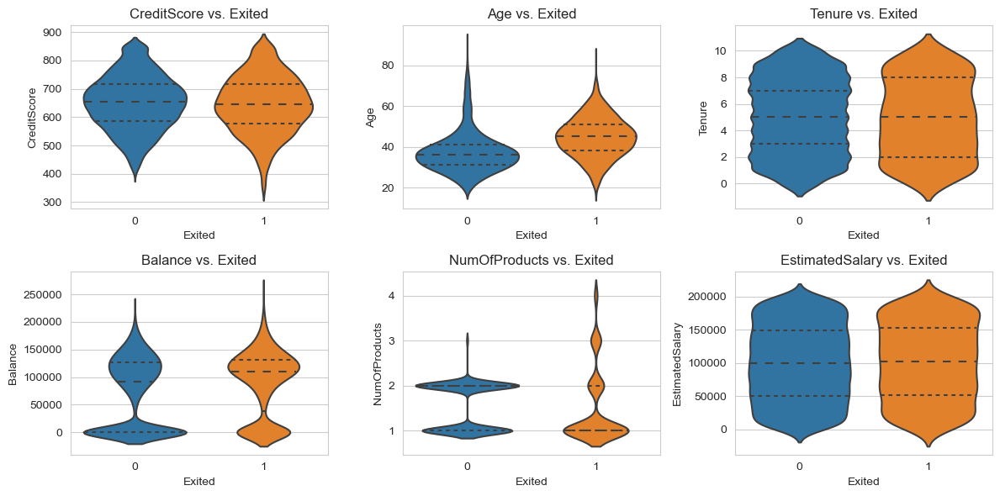

In [31]:
plt.figure(figsize=(12, 6))

for i, feature in enumerate(features, 1):
    plt.subplot(2, 3, i) 
    sns.violinplot(data=df, x='Exited', y=feature, inner='quartile')
    plt.title(f'{feature} vs. Exited')

plt.tight_layout()
plt.show()


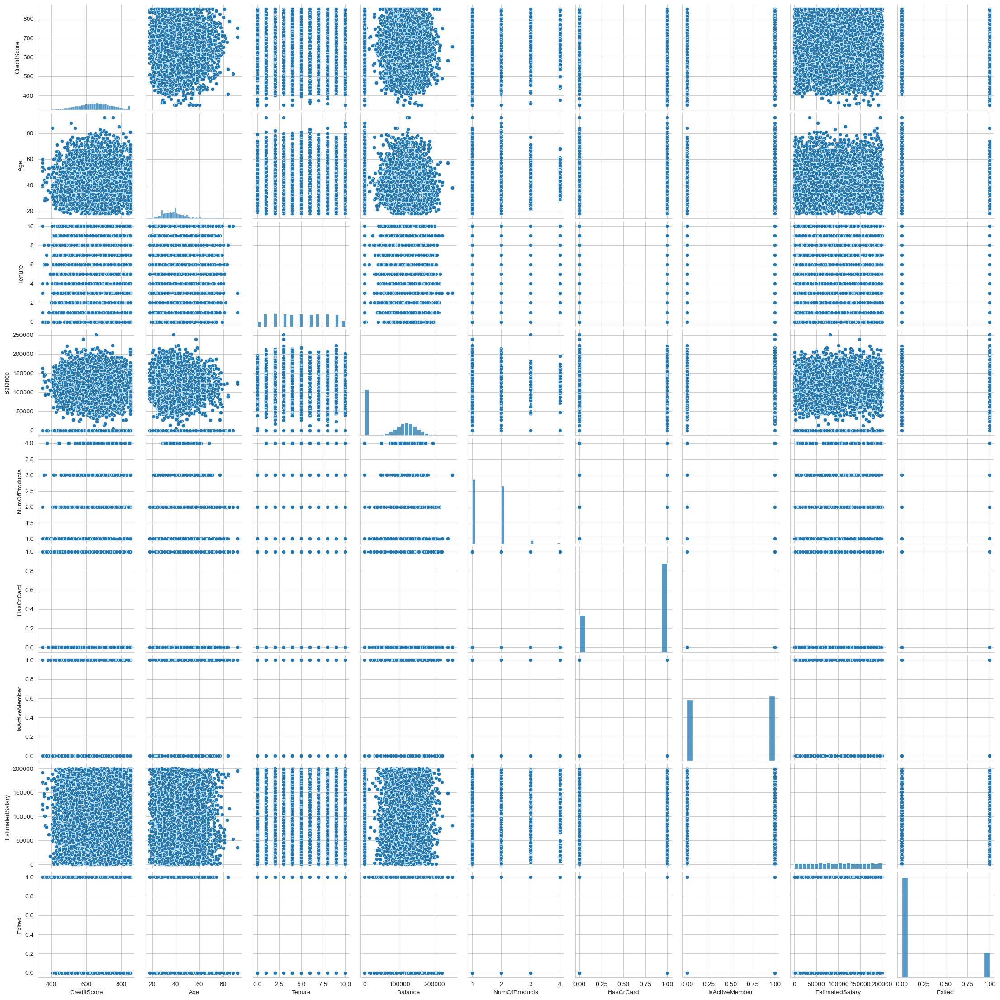

In [32]:
sns.pairplot(df)

In [33]:
df.select_dtypes(exclude=['object']).corr()

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
CreditScore,1.000,-0.004,0.001,0.006,0.012,-0.005,0.026,-0.001,-0.027
Age,-0.004,1.000,-0.010,0.028,-0.031,-0.012,0.085,-0.007,0.285
Tenure,0.001,-0.010,1.000,-0.012,0.013,0.023,-0.028,0.008,-0.014
Balance,0.006,0.028,-0.012,1.000,-0.304,-0.015,-0.010,0.013,0.119
NumOfProducts,0.012,-0.031,0.013,-0.304,1.000,0.003,0.010,0.014,-0.048
HasCrCard,-0.005,-0.012,0.023,-0.015,0.003,1.000,-0.012,-0.010,-0.007
IsActiveMember,0.026,0.085,-0.028,-0.010,0.010,-0.012,1.000,-0.011,-0.156
EstimatedSalary,-0.001,-0.007,0.008,0.013,0.014,-0.010,-0.011,1.000,0.012
Exited,-0.027,0.285,-0.014,0.119,-0.048,-0.007,-0.156,0.012,1.000


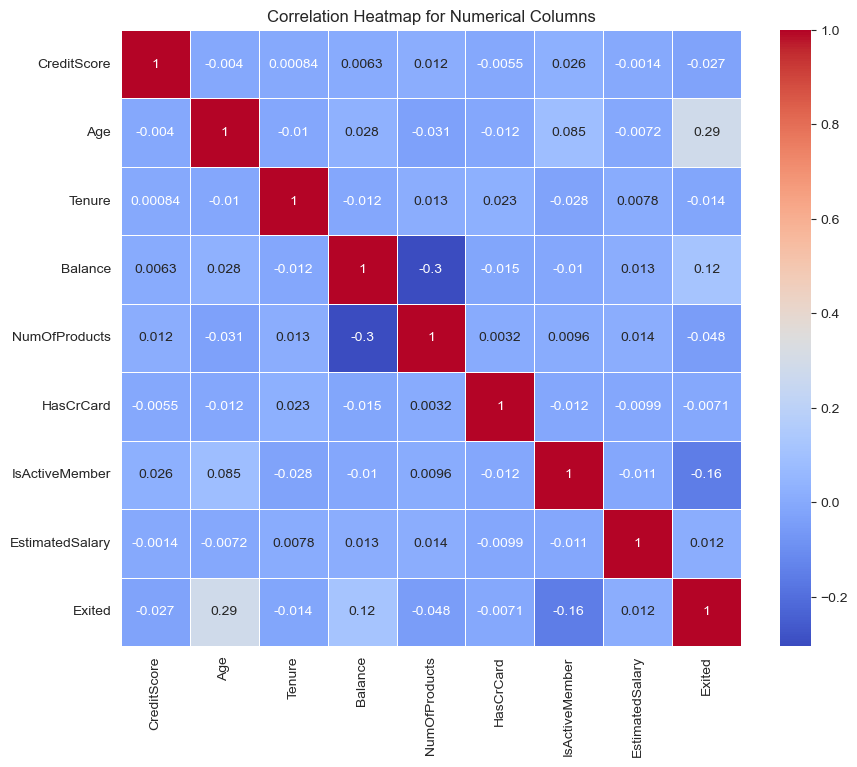

In [34]:

correlation_matrix = df.select_dtypes(exclude=['object']).corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap for Numerical Columns')
plt.show()


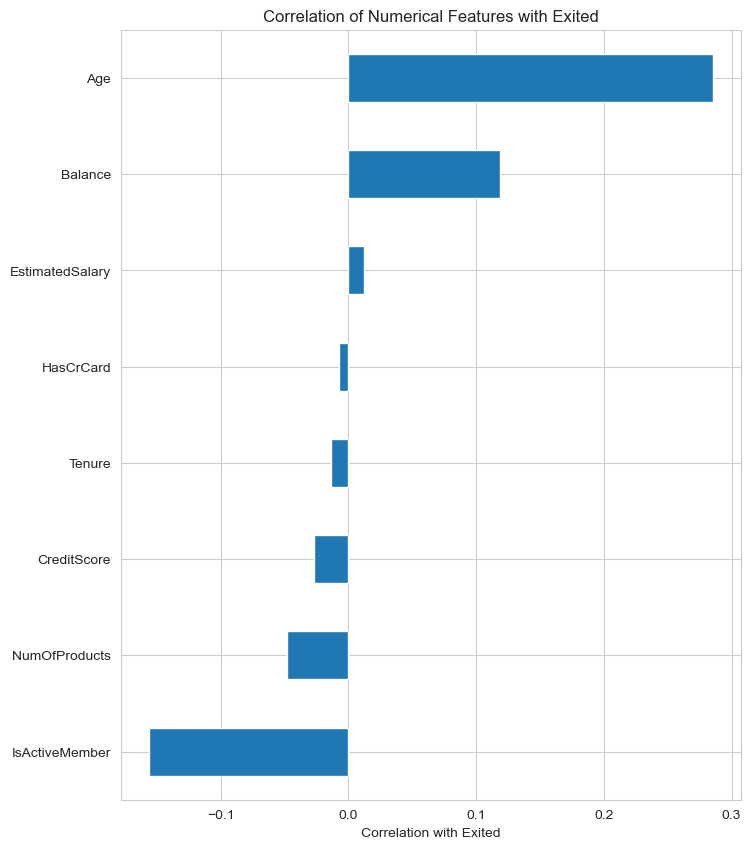

In [35]:
correlation_series = df.select_dtypes(exclude=['object']).corr()['Exited'].drop("Exited")

plt.figure(figsize=(10, 10))
correlation_series.sort_values().plot(kind="barh")
plt.xlabel("Correlation with Exited")
plt.title("Correlation of Numerical Features with Exited")
plt.show()


In [36]:
# This cell of code performs outlier detection for numerical columns in a DataFrame.
# It calculates the first quartile (Q1), third quartile (Q3), and interquartile range (IQR) for each column,
# and identifies outliers using the IQR method. Outliers are counted and the results are stored in a DataFrame.

numerical_columns = df.select_dtypes(exclude=['object']).columns.difference(['Exited']) # we need to not re check the Target columns to see the outliers because it will give an outliaers and in we look close we know it's checking for a discreat column which is the tanget and has two classes 
Q1 = df[numerical_columns].quantile(0.25)
Q3 = df[numerical_columns].quantile(0.75)
IQR = Q3 - Q1

outlier_data = []

for column in numerical_columns:
    lower_bound = Q1[column] - 1.5 * IQR[column]
    upper_bound = Q3[column] + 1.5 * IQR[column]
    column_outliers = ((df[column] < lower_bound) | (df[column] > upper_bound))
    outlier_count = column_outliers.sum()
    outlier_data.append({'Column': column, 'Outlier Count': outlier_count})

outlier_counts = pd.DataFrame(outlier_data)


In [37]:
print(f'''
------------Outliers------------
{outlier_counts}
------------Total------------
             {outlier_counts['Outlier Count'].sum()}''')


------------Outliers------------
            Column  Outlier Count
0              Age            359
1          Balance              0
2      CreditScore             15
3  EstimatedSalary              0
4        HasCrCard              0
5   IsActiveMember              0
6    NumOfProducts             60
7           Tenure              0
------------Total------------
             434


In [38]:
# using the IQR method separately for each class within the 'Exited' column. The results, including
# class labels, column names, and outlier counts, are stored in a DataFrame called 'outlier_counts_by_class'.
numerical_columns = df.select_dtypes(exclude=['object']).columns.difference(['Exited']) 
Q1 = df[numerical_columns].quantile(0.25)
Q3 = df[numerical_columns].quantile(0.75)
IQR = Q3 - Q1

outlier_data = []

for class_label in df['Exited'].unique():
    class_data = df[df['Exited'] == class_label]

    for column in numerical_columns:
        lower_bound = Q1[column] - 1.5 * IQR[column]
        upper_bound = Q3[column] + 1.5 * IQR[column]
        column_outliers = ((class_data[column] < lower_bound) | (class_data[column] > upper_bound))
        outlier_count = column_outliers.sum()

        outlier_data.append({
            'Class': class_label,
            'Column': column,
            'Outlier Count': outlier_count
        })

outlier_counts_by_class = pd.DataFrame(outlier_data)


In [39]:
print(f'''
------------Outliers------------
{outlier_counts_by_class}
------------Total------------
             {outlier_counts_by_class['Outlier Count'].sum()}''')


------------Outliers------------
    Class           Column  Outlier Count
0       1              Age             73
1       1          Balance              0
2       1      CreditScore             15
3       1  EstimatedSalary              0
4       1        HasCrCard              0
5       1   IsActiveMember              0
6       1    NumOfProducts             60
7       1           Tenure              0
8       0              Age            286
9       0          Balance              0
10      0      CreditScore              0
11      0  EstimatedSalary              0
12      0        HasCrCard              0
13      0   IsActiveMember              0
14      0    NumOfProducts              0
15      0           Tenure              0
------------Total------------
             434


In [40]:
outlier_counts_by_class.groupby('Class')['Outlier Count'].sum()

Class
0    286
1    148
Name: Outlier Count, dtype: int64

In [41]:
df['Geography'].unique()

array(['France', 'Spain', 'Germany'], dtype=object)

In [42]:
print('Shape of df Before encoding',df.shape)
df['Gender'] = df['Gender'].map({'Female': 0, 'Male': 1})
df = pd.get_dummies(df, columns=['Geography'], prefix=['Geography'])
print('Shape of df After encoding',df.shape)


Shape of df Before encoding (10000, 11)
Shape of df After encoding (10000, 13)


In [43]:
df[['Geography_France','Geography_Germany','Geography_Spain']].head()

,Geography_France,Geography_Germany,Geography_Spain
0,True,False,False
1,False,False,True
2,True,False,False
3,True,False,False
4,False,False,True


In [44]:
for column in df.columns:
    df[column] = df[column].astype(int)

In [45]:
df[['Geography_France','Geography_Germany','Geography_Spain']].head()

,Geography_France,Geography_Germany,Geography_Spain
0,1,0,0
1,0,0,1
2,1,0,0
3,1,0,0
4,0,0,1


In [46]:
df.shape

(10000, 13)

# Preprocessing of Data
- Train | Test Split, Scalling

In [47]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

In [48]:
X = df.drop("Exited", axis=1)
y = df["Exited"]

In [49]:
print('''
Shape of X is  : {}
Shape of Y is  : {}
Shape of df is : {}'''.format(X.shape,y.shape,df.shape))


Shape of X is  : (10000, 12)
Shape of Y is  : (10000,)
Shape of df is : (10000, 13)


In [50]:
seed = 13

In [51]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, stratify=y, test_size=0.10, random_state=seed
)

In [52]:
X_train, X_val, y_train, y_val = train_test_split(
    X, y, stratify=y, test_size=0.10, random_state=seed
)

In [53]:
print('''
X_train Shape is {}
X_test, Shape is {}
y_train Shape is {} 
y_test  Shape is {}
X_val   Shape is {}
y_val   Shape is {}
'''.format(X_train.shape, X_test.shape, y_train.shape, y_test.shape,X_val.shape,y_val.shape))


X_train Shape is (9000, 12)
X_test, Shape is (1000, 12)
y_train Shape is (9000,) 
y_test  Shape is (1000,)
X_val   Shape is (1000, 12)
y_val   Shape is (1000,)



In [54]:
Scaler = MinMaxScaler()
X_train = Scaler.fit_transform(X_train)
X_test = Scaler.transform(X_test)
X_val = Scaler.transform(X_val)

In [55]:
print('''
Scaling ------
X_train Shape is {}
X_test, Shape is {}
X_val   Shape is {}
'''.format(X_train.shape, X_test.shape,X_val.shape))



Scaling ------
X_train Shape is (9000, 12)
X_test, Shape is (1000, 12)
X_val   Shape is (1000, 12)



# Modelling & Model Performance

## without class_weigth

### Create The Model

In [57]:
pip install tensorflow

  Obtaining dependency information for tensorflow from https://files.pythonhosted.org/packages/80/6f/57d36f6507e432d7fc1956b2e9e8530c5c2d2bfcd8821bcbfae271cd6688/tensorflow-2.14.0-cp311-cp311-win_amd64.whl.metadata
  Obtaining dependency information for tensorflow-intel==2.14.0 from https://files.pythonhosted.org/packages/ad/6e/1bfe367855dd87467564f7bf9fa14f3b17889988e79598bc37bf18f5ffb6/tensorflow_intel-2.14.0-cp311-cp311-win_amd64.whl.metadata
  Obtaining dependency information for absl-py>=1.0.0 from https://files.pythonhosted.org/packages/01/e4/dc0a1dcc4e74e08d7abedab278c795eef54a224363bb18f5692f416d834f/absl_py-2.0.0-py3-none-any.whl.metadata
  Obtaining dependency information for flatbuffers>=23.5.26 from https://files.pythonhosted.org/packages/6f/12/d5c79ee252793ffe845d58a913197bfa02ae9a0b5c9bc3dc4b58d477b9e7/flatbuffers-23.5.26-py2.py3-none-any.whl.metadata
     ---------------------------------------- 0.0/57.5 kB ? eta -:--:--
     --------------------- ------------------ 30.7

In [58]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay,RocCurveDisplay, roc_auc_score, roc_curve,precision_recall_curve,average_precision_score,recall_score
from sklearn.model_selection import cross_val_score, cross_validate,GridSearchCV
from tensorflow.keras.optimizers.legacy import Adam

In [ ]:
# model = Sequential() 
# model.add(Dense(24, activation = "relu", input_dim = X_train.shape[1]))
# model.add(Dense(12, activation = "relu"))
# model.add(Dense(1, activation  = "sigmoid"))
# opt = Adam(lr = 0.001)
# model.compile(optimizer = opt , loss = "binary_crossentropy", metrics = ["Recall"])

In [59]:
model = Sequential()
model.add(Dense(24, activation = "relu", input_dim = X_train.shape[1]))
model.add(Dense(12, activation = "relu"))
model.add(Dense(1, activation  = "sigmoid"))
opt = Adam(lr = 0.001) # Defult value 
model.compile(optimizer = opt , loss = "binary_crossentropy", metrics = ["accuracy"])

In [60]:
model.fit(
    x=X_train, y=y_train, validation_data=(X_val,y_val), batch_size=64, epochs=500, verbose=1
)

Epoch 1/500
141/141 [==============================] - 1s 5ms/step - loss: 0.5304 - accuracy: 0.7880 - val_loss: 0.4797 - val_accuracy: 0.7960
Epoch 2/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4716 - accuracy: 0.7963 - val_loss: 0.4597 - val_accuracy: 0.7960
Epoch 3/500
141/141 [==============================] - 1s 4ms/step - loss: 0.4571 - accuracy: 0.7981 - val_loss: 0.4503 - val_accuracy: 0.8040
Epoch 4/500
141/141 [==============================] - 1s 4ms/step - loss: 0.4428 - accuracy: 0.8073 - val_loss: 0.4387 - val_accuracy: 0.8230
Epoch 5/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.8129 - val_loss: 0.4279 - val_accuracy: 0.8250
Epoch 6/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4128 - accuracy: 0.8197 - val_loss: 0.4190 - val_accuracy: 0.8280
Epoch 7/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4013 - accuracy: 0.8258 - val_loss: 0.4119 - val_accuracy: 0.8340

Epoch 58/500
141/141 [==============================] - 1s 4ms/step - loss: 0.3304 - accuracy: 0.8647 - val_loss: 0.3684 - val_accuracy: 0.8520
Epoch 59/500
141/141 [==============================] - 1s 4ms/step - loss: 0.3302 - accuracy: 0.8646 - val_loss: 0.3713 - val_accuracy: 0.8470
Epoch 60/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3298 - accuracy: 0.8662 - val_loss: 0.3705 - val_accuracy: 0.8460
Epoch 61/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3301 - accuracy: 0.8651 - val_loss: 0.3690 - val_accuracy: 0.8460
Epoch 62/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3294 - accuracy: 0.8651 - val_loss: 0.3727 - val_accuracy: 0.8440
Epoch 63/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3299 - accuracy: 0.8633 - val_loss: 0.3687 - val_accuracy: 0.8460
Epoch 64/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3300 - accuracy: 0.8641 - val_loss: 0.3702 - val_accuracy:

Epoch 115/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3208 - accuracy: 0.8680 - val_loss: 0.3700 - val_accuracy: 0.8450
Epoch 116/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3206 - accuracy: 0.8681 - val_loss: 0.3716 - val_accuracy: 0.8450
Epoch 117/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3203 - accuracy: 0.8698 - val_loss: 0.3663 - val_accuracy: 0.8470
Epoch 118/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3213 - accuracy: 0.8664 - val_loss: 0.3645 - val_accuracy: 0.8480
Epoch 119/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3195 - accuracy: 0.8691 - val_loss: 0.3632 - val_accuracy: 0.8520
Epoch 120/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3206 - accuracy: 0.8691 - val_loss: 0.3658 - val_accuracy: 0.8480
Epoch 121/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3193 - accuracy: 0.8693 - val_loss: 0.3689 - val_ac

141/141 [==============================] - 0s 3ms/step - loss: 0.3161 - accuracy: 0.8696 - val_loss: 0.3639 - val_accuracy: 0.8480
Epoch 172/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3157 - accuracy: 0.8706 - val_loss: 0.3634 - val_accuracy: 0.8480
Epoch 173/500
141/141 [==============================] - 0s 2ms/step - loss: 0.3154 - accuracy: 0.8686 - val_loss: 0.3686 - val_accuracy: 0.8430
Epoch 174/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3165 - accuracy: 0.8663 - val_loss: 0.3635 - val_accuracy: 0.8460
Epoch 175/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3148 - accuracy: 0.8721 - val_loss: 0.3667 - val_accuracy: 0.8420
Epoch 176/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3152 - accuracy: 0.8700 - val_loss: 0.3703 - val_accuracy: 0.8410
Epoch 177/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3149 - accuracy: 0.8708 - val_loss: 0.3631 - val_accuracy: 0.8490

141/141 [==============================] - 0s 3ms/step - loss: 0.3132 - accuracy: 0.8710 - val_loss: 0.3739 - val_accuracy: 0.8370
Epoch 228/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3120 - accuracy: 0.8716 - val_loss: 0.3686 - val_accuracy: 0.8420
Epoch 229/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3118 - accuracy: 0.8728 - val_loss: 0.3640 - val_accuracy: 0.8530
Epoch 230/500
141/141 [==============================] - 1s 4ms/step - loss: 0.3125 - accuracy: 0.8722 - val_loss: 0.3667 - val_accuracy: 0.8420
Epoch 231/500
141/141 [==============================] - 0s 2ms/step - loss: 0.3118 - accuracy: 0.8728 - val_loss: 0.3673 - val_accuracy: 0.8480
Epoch 232/500
141/141 [==============================] - 0s 2ms/step - loss: 0.3120 - accuracy: 0.8707 - val_loss: 0.3679 - val_accuracy: 0.8470
Epoch 233/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3113 - accuracy: 0.8724 - val_loss: 0.3642 - val_accuracy: 0.8510

141/141 [==============================] - 0s 3ms/step - loss: 0.3095 - accuracy: 0.8740 - val_loss: 0.3712 - val_accuracy: 0.8460
Epoch 284/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3101 - accuracy: 0.8740 - val_loss: 0.3690 - val_accuracy: 0.8500
Epoch 285/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3096 - accuracy: 0.8742 - val_loss: 0.3664 - val_accuracy: 0.8510
Epoch 286/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3096 - accuracy: 0.8738 - val_loss: 0.3646 - val_accuracy: 0.8530
Epoch 287/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3097 - accuracy: 0.8733 - val_loss: 0.3681 - val_accuracy: 0.8490
Epoch 288/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3094 - accuracy: 0.8731 - val_loss: 0.3671 - val_accuracy: 0.8500
Epoch 289/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3099 - accuracy: 0.8739 - val_loss: 0.3666 - val_accuracy: 0.8510

141/141 [==============================] - 0s 3ms/step - loss: 0.3076 - accuracy: 0.8742 - val_loss: 0.3697 - val_accuracy: 0.8480
Epoch 340/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3079 - accuracy: 0.8748 - val_loss: 0.3694 - val_accuracy: 0.8500
Epoch 341/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3069 - accuracy: 0.8738 - val_loss: 0.3663 - val_accuracy: 0.8530
Epoch 342/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3076 - accuracy: 0.8736 - val_loss: 0.3689 - val_accuracy: 0.8520
Epoch 343/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3076 - accuracy: 0.8738 - val_loss: 0.3696 - val_accuracy: 0.8540
Epoch 344/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3071 - accuracy: 0.8747 - val_loss: 0.3694 - val_accuracy: 0.8490
Epoch 345/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3076 - accuracy: 0.8737 - val_loss: 0.3732 - val_accuracy: 0.8500

141/141 [==============================] - 0s 3ms/step - loss: 0.3065 - accuracy: 0.8739 - val_loss: 0.3706 - val_accuracy: 0.8530
Epoch 396/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3069 - accuracy: 0.8757 - val_loss: 0.3706 - val_accuracy: 0.8480
Epoch 397/500
141/141 [==============================] - 0s 2ms/step - loss: 0.3060 - accuracy: 0.8759 - val_loss: 0.3833 - val_accuracy: 0.8390
Epoch 398/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3061 - accuracy: 0.8754 - val_loss: 0.3687 - val_accuracy: 0.8510
Epoch 399/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3056 - accuracy: 0.8752 - val_loss: 0.3731 - val_accuracy: 0.8470
Epoch 400/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3062 - accuracy: 0.8746 - val_loss: 0.3736 - val_accuracy: 0.8470
Epoch 401/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3057 - accuracy: 0.8766 - val_loss: 0.3702 - val_accuracy: 0.8490

141/141 [==============================] - 0s 3ms/step - loss: 0.3051 - accuracy: 0.8750 - val_loss: 0.3693 - val_accuracy: 0.8480
Epoch 452/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3046 - accuracy: 0.8768 - val_loss: 0.3685 - val_accuracy: 0.8520
Epoch 453/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3043 - accuracy: 0.8774 - val_loss: 0.3726 - val_accuracy: 0.8410
Epoch 454/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3054 - accuracy: 0.8741 - val_loss: 0.3703 - val_accuracy: 0.8470
Epoch 455/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3059 - accuracy: 0.8766 - val_loss: 0.3682 - val_accuracy: 0.8470
Epoch 456/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3035 - accuracy: 0.8768 - val_loss: 0.3690 - val_accuracy: 0.8480
Epoch 457/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3045 - accuracy: 0.8766 - val_loss: 0.3687 - val_accuracy: 0.8560

In [63]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 24)                312       
                                                                 
 dense_1 (Dense)             (None, 12)                300       
                                                                 
 dense_2 (Dense)             (None, 1)                 13        
                                                                 
Total params: 625 (2.44 KB)
Trainable params: 625 (2.44 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [64]:
loss_df = pd.DataFrame(model.history.history)
loss_df.head()

""


### Evaluate The Model

- Plot the model history to observe the changing of metrics
- Make prediction to see "confusion matrix" and "classification report"
- Check ROC (Receiver Operating Curve) and AUC (Area Under Curve) for the model

In [66]:
print(loss_df.dtypes)


Series([], dtype: object)


In [68]:
from sklearn.metrics import roc_curve, auc

def evaluate_classification_model(model, X_train, y_train, X_test, y_test):
    # Make predictions on the test and training sets
    y_pred = model.predict(X_test) > 0.5
    y_train_pred = model.predict(X_train) > 0.5
    y_pred_p = model.predict(X_test)

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    # Plot and display the confusion matrix for the test set
    cm_test = confusion_matrix(y_test, y_pred)
    disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=[0, 1])
    disp_test.plot(cmap='Blues', ax=axes[0])
    axes[0].set_title('Test Set Confusion Matrix')

    # Plot and display the confusion matrix for the training set
    cm_train = confusion_matrix(y_train, y_train_pred)
    disp_train = ConfusionMatrixDisplay(confusion_matrix=cm_train, display_labels=[0, 1])
    disp_train.plot(cmap='Blues', ax=axes[1])
    axes[1].set_title('Training Set Confusion Matrix')

    plt.show()

    train_report = classification_report(y_train, y_train_pred)
    test_report = classification_report(y_test, y_pred)

    print(f'''
-----------------------------Train Results-----------------------------
{train_report}
                        
-----------------------------Test Results-----------------------------
{test_report}
''')
    print('-----------------------------precision_recall_curve-----------------------------')
    precisions, recalls, thresholds = precision_recall_curve(y_test, y_pred_p)
    plt.plot(recalls, precisions, label='ANN')
    plt.xlabel('Recalls')
    plt.ylabel('Precisions')
    plt.title('Precision-Recall Curve')
    plt.show()

    fpr, tpr, _ = roc_curve(y_test, y_pred_p)
    roc_auc = auc(fpr, tpr)
    print('-----------------------------Receiver Operating Characteristic-----------------------------')

    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()
# This function is used to evaluate a binary classification model's performance.
# It calculates and displays various metrics, including confusion matrices, classification reports,
# precision-recall curves, and receiver operating characteristic (ROC) curves for both the training
# and test datasets. The model's predictions are compared to the ground truth labels, and the results
# are visualized to assess the model's performance.
# Usage example:
# evaluate_classification_model(model, X_train, y_train, X_test, y_test)


In [69]:
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
print('''
Loss is :   {}
Accuracy is {}'''.format(loss, accuracy))


Loss is :   0.3697222173213959
Accuracy is 0.843999981880188


32/32 [==============================] - 0s 1ms/step


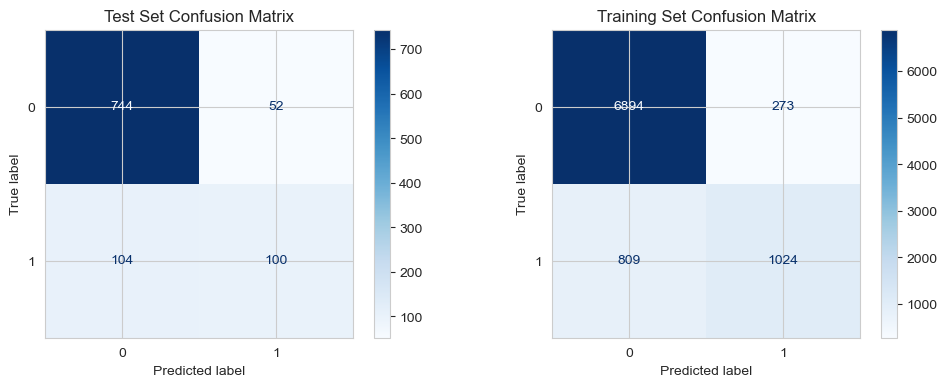


-----------------------------Train Results-----------------------------
              precision    recall  f1-score   support

           0       0.89      0.96      0.93      7167
           1       0.79      0.56      0.65      1833

    accuracy                           0.88      9000
   macro avg       0.84      0.76      0.79      9000
weighted avg       0.87      0.88      0.87      9000

                        
-----------------------------Test Results-----------------------------
              precision    recall  f1-score   support

           0       0.88      0.93      0.91       796
           1       0.66      0.49      0.56       204

    accuracy                           0.84      1000
   macro avg       0.77      0.71      0.73      1000
weighted avg       0.83      0.84      0.84      1000


-----------------------------precision_recall_curve-----------------------------


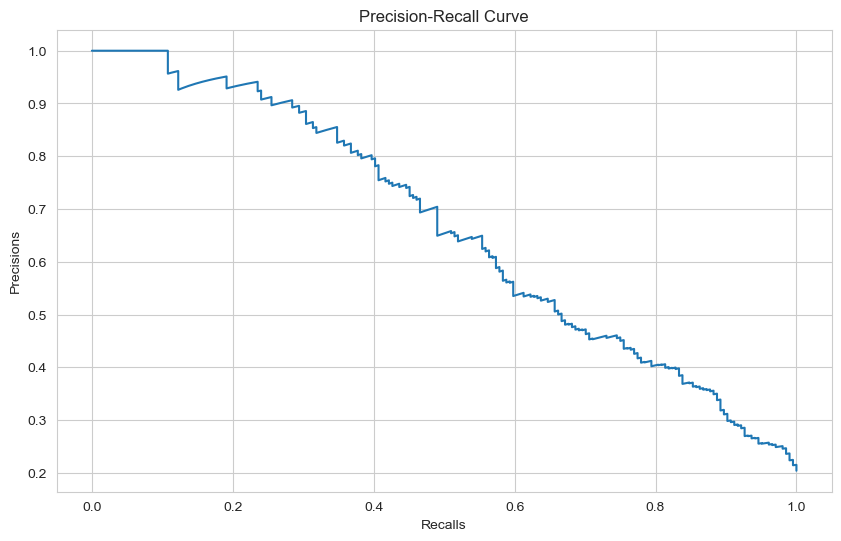

-----------------------------Receiver Operating Characteristic-----------------------------


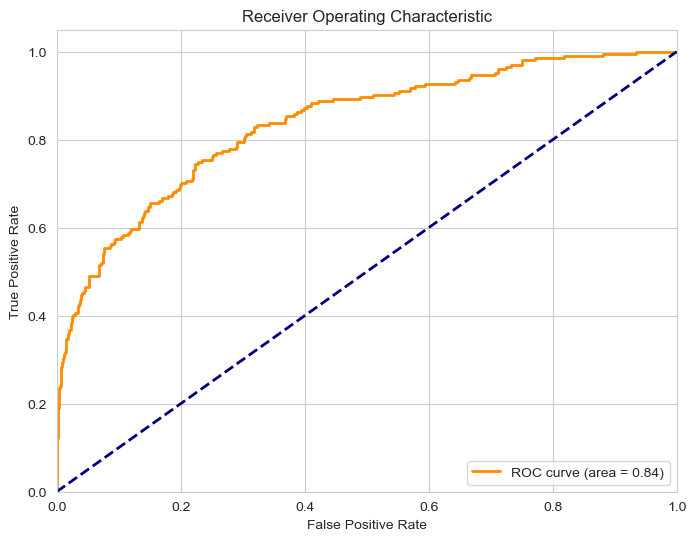

In [70]:
evaluate_classification_model(model, X_train, y_train, X_test, y_test)

## with class_weigth

Investigate how the "class_weight" hyper-parameter is used in a Neural Network.

### Create The Model

In [71]:
from sklearn.utils import class_weight

In [72]:
model1 = Sequential()
model1.add(Dense(24, activation = "relu", input_dim = X_train.shape[1]))
model1.add(Dense(12, activation = "relu"))
model1.add(Dense(1, activation  = "sigmoid"))
opt = Adam(lr = 0.001)
model1.compile(optimizer = opt , loss = "binary_crossentropy", metrics = ["accuracy"])

In [73]:
# Calculate class weights to address class imbalance in the training data. 
# The 'balanced' option assigns weights inversely proportional to class frequencies,
# giving more weight to underrepresented classes. This helps the model to better handle
# imbalanced datasets and make training more effective.
class_weights = class_weight.compute_class_weight('balanced',
                                                   classes=np.unique(y_train),
                                                   y=y_train)
class_weights

array([0.62787777, 2.45499182])

In [74]:
# Create a dictionary of class weights to be used during model training.
class_weights = {0: class_weights[0], 1:class_weights[1]}
class_weights


{0: 0.6278777731268314, 1: 2.454991816693944}

In [75]:
model1.fit(x=X_train, y=y_train,validation_data=(X_val,y_val), class_weight=class_weights, batch_size=64,verbose=1,epochs=500)

Epoch 1/500
141/141 [==============================] - 1s 5ms/step - loss: 0.6687 - accuracy: 0.6538 - val_loss: 0.6214 - val_accuracy: 0.7160
Epoch 2/500
141/141 [==============================] - 0s 3ms/step - loss: 0.6319 - accuracy: 0.6703 - val_loss: 0.6172 - val_accuracy: 0.6740
Epoch 3/500
141/141 [==============================] - 0s 3ms/step - loss: 0.6069 - accuracy: 0.6816 - val_loss: 0.5859 - val_accuracy: 0.6980
Epoch 4/500
141/141 [==============================] - 1s 4ms/step - loss: 0.5838 - accuracy: 0.7013 - val_loss: 0.6011 - val_accuracy: 0.6750
Epoch 5/500
141/141 [==============================] - 0s 3ms/step - loss: 0.5659 - accuracy: 0.7201 - val_loss: 0.6166 - val_accuracy: 0.6670
Epoch 6/500
141/141 [==============================] - 1s 4ms/step - loss: 0.5545 - accuracy: 0.7299 - val_loss: 0.5407 - val_accuracy: 0.7170
Epoch 7/500
141/141 [==============================] - 0s 2ms/step - loss: 0.5412 - accuracy: 0.7347 - val_loss: 0.5221 - val_accuracy: 0.7360

Epoch 58/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4511 - accuracy: 0.7863 - val_loss: 0.4374 - val_accuracy: 0.7940
Epoch 59/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4499 - accuracy: 0.7913 - val_loss: 0.4951 - val_accuracy: 0.7630
Epoch 60/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4482 - accuracy: 0.7893 - val_loss: 0.5387 - val_accuracy: 0.7380
Epoch 61/500
141/141 [==============================] - 1s 4ms/step - loss: 0.4500 - accuracy: 0.7876 - val_loss: 0.5097 - val_accuracy: 0.7550
Epoch 62/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4491 - accuracy: 0.7892 - val_loss: 0.4963 - val_accuracy: 0.7600
Epoch 63/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4493 - accuracy: 0.7881 - val_loss: 0.5436 - val_accuracy: 0.7280
Epoch 64/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4480 - accuracy: 0.7872 - val_loss: 0.5000 - val_accuracy:

Epoch 115/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4375 - accuracy: 0.7997 - val_loss: 0.5133 - val_accuracy: 0.7470
Epoch 116/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4363 - accuracy: 0.7987 - val_loss: 0.4625 - val_accuracy: 0.7830
Epoch 117/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4372 - accuracy: 0.8026 - val_loss: 0.4635 - val_accuracy: 0.7870
Epoch 118/500
141/141 [==============================] - 1s 4ms/step - loss: 0.4378 - accuracy: 0.8006 - val_loss: 0.4991 - val_accuracy: 0.7590
Epoch 119/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4374 - accuracy: 0.8007 - val_loss: 0.5180 - val_accuracy: 0.7500
Epoch 120/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4359 - accuracy: 0.8012 - val_loss: 0.4470 - val_accuracy: 0.8040
Epoch 121/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4363 - accuracy: 0.8030 - val_loss: 0.4789 - val_ac

141/141 [==============================] - 0s 3ms/step - loss: 0.4312 - accuracy: 0.8019 - val_loss: 0.4600 - val_accuracy: 0.7840
Epoch 172/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4301 - accuracy: 0.8049 - val_loss: 0.4769 - val_accuracy: 0.7770
Epoch 173/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4319 - accuracy: 0.8023 - val_loss: 0.4757 - val_accuracy: 0.7780
Epoch 174/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4315 - accuracy: 0.8021 - val_loss: 0.4738 - val_accuracy: 0.7760
Epoch 175/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4315 - accuracy: 0.7994 - val_loss: 0.4496 - val_accuracy: 0.7950
Epoch 176/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4313 - accuracy: 0.8047 - val_loss: 0.4553 - val_accuracy: 0.7940
Epoch 177/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4297 - accuracy: 0.8006 - val_loss: 0.5266 - val_accuracy: 0.7350

141/141 [==============================] - 1s 4ms/step - loss: 0.4254 - accuracy: 0.8020 - val_loss: 0.5070 - val_accuracy: 0.7490
Epoch 228/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4270 - accuracy: 0.8037 - val_loss: 0.4867 - val_accuracy: 0.7580
Epoch 229/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4252 - accuracy: 0.7999 - val_loss: 0.4254 - val_accuracy: 0.8150
Epoch 230/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4259 - accuracy: 0.8068 - val_loss: 0.4643 - val_accuracy: 0.7830
Epoch 231/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4259 - accuracy: 0.8042 - val_loss: 0.4929 - val_accuracy: 0.7500
Epoch 232/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4291 - accuracy: 0.8037 - val_loss: 0.5464 - val_accuracy: 0.7310
Epoch 233/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4256 - accuracy: 0.8059 - val_loss: 0.4915 - val_accuracy: 0.7550

141/141 [==============================] - 0s 3ms/step - loss: 0.4216 - accuracy: 0.8077 - val_loss: 0.5096 - val_accuracy: 0.7580
Epoch 284/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4197 - accuracy: 0.8057 - val_loss: 0.5023 - val_accuracy: 0.7600
Epoch 285/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4214 - accuracy: 0.8032 - val_loss: 0.4524 - val_accuracy: 0.7920
Epoch 286/500
141/141 [==============================] - 1s 4ms/step - loss: 0.4202 - accuracy: 0.8053 - val_loss: 0.5424 - val_accuracy: 0.7340
Epoch 287/500
141/141 [==============================] - 1s 4ms/step - loss: 0.4213 - accuracy: 0.8051 - val_loss: 0.4661 - val_accuracy: 0.7840
Epoch 288/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4203 - accuracy: 0.8056 - val_loss: 0.4977 - val_accuracy: 0.7670
Epoch 289/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4224 - accuracy: 0.8027 - val_loss: 0.4928 - val_accuracy: 0.7670

141/141 [==============================] - 0s 3ms/step - loss: 0.4168 - accuracy: 0.8064 - val_loss: 0.5531 - val_accuracy: 0.7350
Epoch 340/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4179 - accuracy: 0.8061 - val_loss: 0.5118 - val_accuracy: 0.7570
Epoch 341/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4165 - accuracy: 0.8087 - val_loss: 0.5598 - val_accuracy: 0.7290
Epoch 342/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4172 - accuracy: 0.8088 - val_loss: 0.5203 - val_accuracy: 0.7580
Epoch 343/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4173 - accuracy: 0.8101 - val_loss: 0.5475 - val_accuracy: 0.7340
Epoch 344/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4154 - accuracy: 0.8051 - val_loss: 0.4603 - val_accuracy: 0.7890
Epoch 345/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4154 - accuracy: 0.8084 - val_loss: 0.5279 - val_accuracy: 0.7440

141/141 [==============================] - 0s 3ms/step - loss: 0.4124 - accuracy: 0.8060 - val_loss: 0.4378 - val_accuracy: 0.7960
Epoch 396/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4136 - accuracy: 0.8128 - val_loss: 0.4945 - val_accuracy: 0.7650
Epoch 397/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4121 - accuracy: 0.8113 - val_loss: 0.5146 - val_accuracy: 0.7530
Epoch 398/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4119 - accuracy: 0.8094 - val_loss: 0.5069 - val_accuracy: 0.7650
Epoch 399/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4128 - accuracy: 0.8134 - val_loss: 0.4907 - val_accuracy: 0.7720
Epoch 400/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4146 - accuracy: 0.8097 - val_loss: 0.4135 - val_accuracy: 0.8150
Epoch 401/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4143 - accuracy: 0.8130 - val_loss: 0.5290 - val_accuracy: 0.7470

141/141 [==============================] - 0s 3ms/step - loss: 0.4106 - accuracy: 0.8094 - val_loss: 0.4494 - val_accuracy: 0.7940
Epoch 452/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4110 - accuracy: 0.8127 - val_loss: 0.4686 - val_accuracy: 0.7930
Epoch 453/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4088 - accuracy: 0.8142 - val_loss: 0.5117 - val_accuracy: 0.7570
Epoch 454/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4096 - accuracy: 0.8104 - val_loss: 0.4861 - val_accuracy: 0.7750
Epoch 455/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4094 - accuracy: 0.8137 - val_loss: 0.4880 - val_accuracy: 0.7660
Epoch 456/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4121 - accuracy: 0.8090 - val_loss: 0.4831 - val_accuracy: 0.7710
Epoch 457/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4079 - accuracy: 0.8120 - val_loss: 0.4987 - val_accuracy: 0.7610

In [76]:
model1.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             (None, 24)                312       
                                                                 
 dense_4 (Dense)             (None, 12)                300       
                                                                 
 dense_5 (Dense)             (None, 1)                 13        
                                                                 
Total params: 625 (2.44 KB)
Trainable params: 625 (2.44 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [77]:
loss_df = pd.DataFrame(model1.history.history)
loss_df.head()

,loss,accuracy,val_loss,val_accuracy
0,0.669,0.654,0.621,0.716
1,0.632,0.670,0.617,0.674
2,0.607,0.682,0.586,0.698
3,0.584,0.701,0.601,0.675
4,0.566,0.720,0.617,0.667


### Evaluate The Model

- Plot the model history to observe the changing of metrics
- Make prediction to see "confusion matrix" and "classification report"
- Check ROC (Receiver Operating Curve) and AUC (Area Under Curve) for the model

In [78]:
loss, accuracy = model1.evaluate(X_test, y_test, verbose=0)
print('''
Loss is :   {}
Accuracy is {}'''.format(loss, accuracy))
# These metrics provide insights into the model's performance on unseen data, helping to assess its generalization capabilities.



Loss is :   0.46994757652282715
Accuracy is 0.7820000052452087


<Axes: >

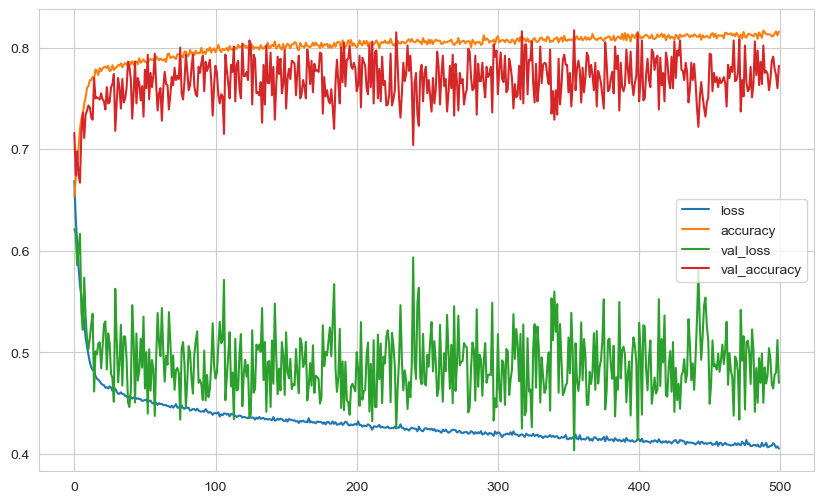

In [79]:
loss_df.plot()

32/32 [==============================] - 0s 2ms/step


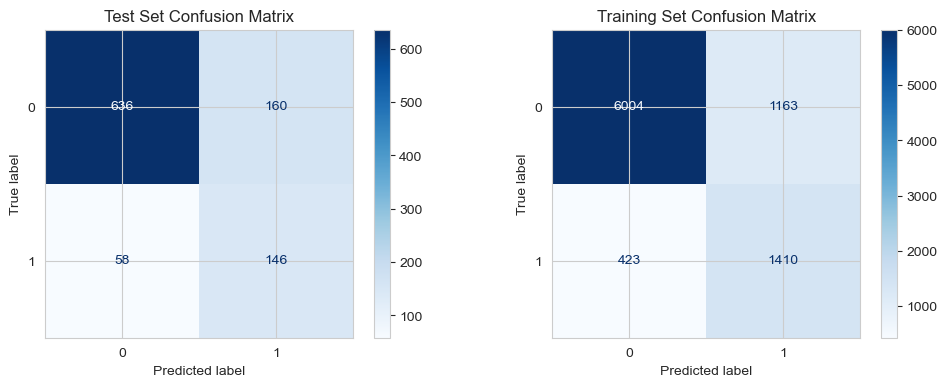


-----------------------------Train Results-----------------------------
              precision    recall  f1-score   support

           0       0.93      0.84      0.88      7167
           1       0.55      0.77      0.64      1833

    accuracy                           0.82      9000
   macro avg       0.74      0.80      0.76      9000
weighted avg       0.86      0.82      0.83      9000

                        
-----------------------------Test Results-----------------------------
              precision    recall  f1-score   support

           0       0.92      0.80      0.85       796
           1       0.48      0.72      0.57       204

    accuracy                           0.78      1000
   macro avg       0.70      0.76      0.71      1000
weighted avg       0.83      0.78      0.80      1000


-----------------------------precision_recall_curve-----------------------------


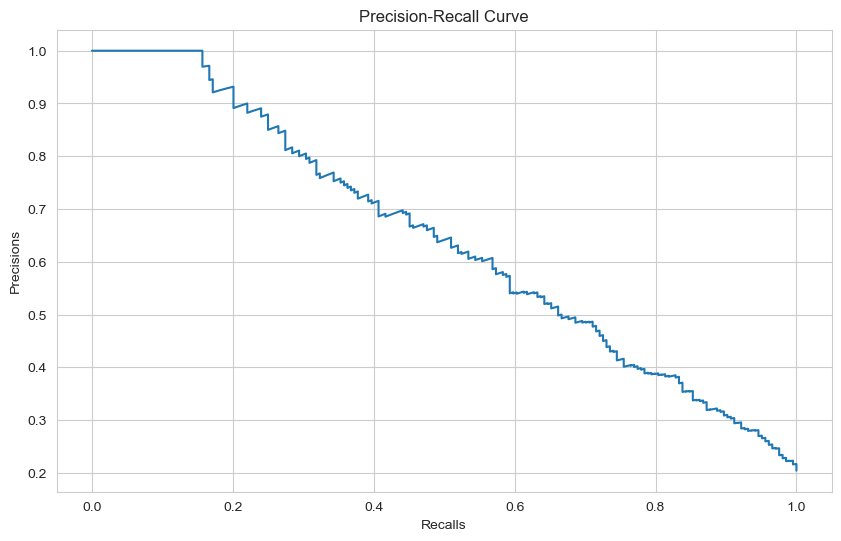

-----------------------------Receiver Operating Characteristic-----------------------------


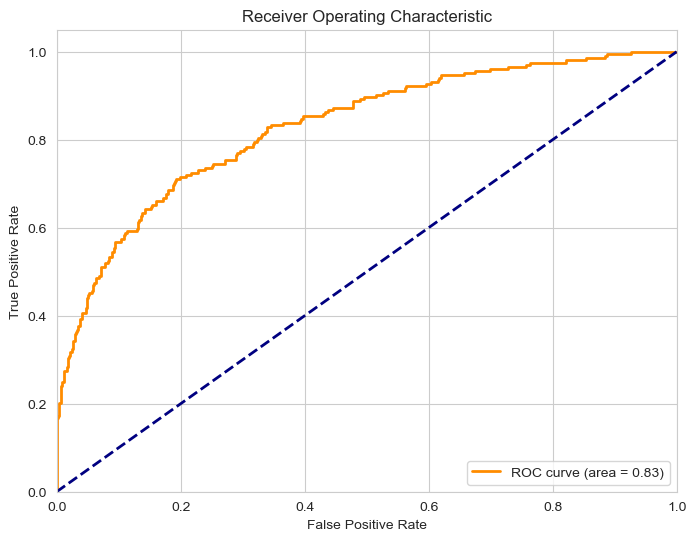

In [80]:
evaluate_classification_model(model1, X_train, y_train, X_test, y_test)

## Implementation Different Methods to Develop The Model

- Implement the following methods on model creating with "class_weight" parameter
- Create and evaluate model for each method

### Increase The Learning Rate and Observe The Results

In [81]:
model3 = Sequential()
model3.add(Dense(24, activation = "relu", input_dim = X_train.shape[1]))
model3.add(Dense(12, activation = "relu"))
model3.add(Dense(1, activation  = "sigmoid"))
opt = Adam(lr = 0.01)
model3.compile(optimizer = opt , loss = "binary_crossentropy", metrics = ["accuracy"])

In [82]:
model3.fit(x = X_train, y = y_train, validation_data=(X_val,y_val), batch_size = 64, epochs = 500, verbose = 1, class_weight=class_weights)

Epoch 1/500
141/141 [==============================] - 1s 4ms/step - loss: 0.6136 - accuracy: 0.6672 - val_loss: 0.6420 - val_accuracy: 0.6600
Epoch 2/500
141/141 [==============================] - 0s 3ms/step - loss: 0.5624 - accuracy: 0.7251 - val_loss: 0.4912 - val_accuracy: 0.7610
Epoch 3/500
141/141 [==============================] - 0s 3ms/step - loss: 0.5035 - accuracy: 0.7537 - val_loss: 0.4551 - val_accuracy: 0.7680
Epoch 4/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4901 - accuracy: 0.7591 - val_loss: 0.4886 - val_accuracy: 0.7490
Epoch 5/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4803 - accuracy: 0.7727 - val_loss: 0.4743 - val_accuracy: 0.7760
Epoch 6/500
141/141 [==============================] - 1s 4ms/step - loss: 0.4759 - accuracy: 0.7780 - val_loss: 0.4648 - val_accuracy: 0.7790
Epoch 7/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4699 - accuracy: 0.7781 - val_loss: 0.4622 - val_accuracy: 0.7800

Epoch 58/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4294 - accuracy: 0.8073 - val_loss: 0.5251 - val_accuracy: 0.7350
Epoch 59/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4289 - accuracy: 0.8027 - val_loss: 0.5319 - val_accuracy: 0.7420
Epoch 60/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4252 - accuracy: 0.8039 - val_loss: 0.4950 - val_accuracy: 0.7520
Epoch 61/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4271 - accuracy: 0.8063 - val_loss: 0.4427 - val_accuracy: 0.7730
Epoch 62/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4262 - accuracy: 0.8070 - val_loss: 0.4903 - val_accuracy: 0.7480
Epoch 63/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4259 - accuracy: 0.8083 - val_loss: 0.5190 - val_accuracy: 0.7490
Epoch 64/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4241 - accuracy: 0.8040 - val_loss: 0.4992 - val_accuracy:

Epoch 115/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4104 - accuracy: 0.8069 - val_loss: 0.4800 - val_accuracy: 0.7650
Epoch 116/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4107 - accuracy: 0.8049 - val_loss: 0.4816 - val_accuracy: 0.7660
Epoch 117/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4080 - accuracy: 0.8096 - val_loss: 0.5302 - val_accuracy: 0.7380
Epoch 118/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4137 - accuracy: 0.8051 - val_loss: 0.4820 - val_accuracy: 0.7680
Epoch 119/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4070 - accuracy: 0.8090 - val_loss: 0.5437 - val_accuracy: 0.7500
Epoch 120/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4080 - accuracy: 0.8096 - val_loss: 0.5234 - val_accuracy: 0.7400
Epoch 121/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4114 - accuracy: 0.8048 - val_loss: 0.4931 - val_ac

141/141 [==============================] - 0s 3ms/step - loss: 0.4023 - accuracy: 0.8097 - val_loss: 0.4756 - val_accuracy: 0.7750
Epoch 172/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4008 - accuracy: 0.8139 - val_loss: 0.5006 - val_accuracy: 0.7580
Epoch 173/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3988 - accuracy: 0.8097 - val_loss: 0.4719 - val_accuracy: 0.7790
Epoch 174/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3981 - accuracy: 0.8126 - val_loss: 0.5626 - val_accuracy: 0.7380
Epoch 175/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4025 - accuracy: 0.8051 - val_loss: 0.5422 - val_accuracy: 0.7390
Epoch 176/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4009 - accuracy: 0.8109 - val_loss: 0.5322 - val_accuracy: 0.7510
Epoch 177/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3999 - accuracy: 0.8116 - val_loss: 0.4803 - val_accuracy: 0.7700

141/141 [==============================] - 0s 3ms/step - loss: 0.3932 - accuracy: 0.8142 - val_loss: 0.5295 - val_accuracy: 0.7540
Epoch 228/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3880 - accuracy: 0.8148 - val_loss: 0.4992 - val_accuracy: 0.7740
Epoch 229/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3934 - accuracy: 0.8164 - val_loss: 0.5802 - val_accuracy: 0.7270
Epoch 230/500
141/141 [==============================] - 1s 4ms/step - loss: 0.3984 - accuracy: 0.8087 - val_loss: 0.4663 - val_accuracy: 0.7880
Epoch 231/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3929 - accuracy: 0.8140 - val_loss: 0.4664 - val_accuracy: 0.7890
Epoch 232/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3914 - accuracy: 0.8159 - val_loss: 0.5088 - val_accuracy: 0.7540
Epoch 233/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3941 - accuracy: 0.8110 - val_loss: 0.5436 - val_accuracy: 0.7450

141/141 [==============================] - 0s 3ms/step - loss: 0.3888 - accuracy: 0.8171 - val_loss: 0.5450 - val_accuracy: 0.7390
Epoch 284/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3900 - accuracy: 0.8150 - val_loss: 0.4811 - val_accuracy: 0.7780
Epoch 285/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3887 - accuracy: 0.8161 - val_loss: 0.5657 - val_accuracy: 0.7350
Epoch 286/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3872 - accuracy: 0.8152 - val_loss: 0.5127 - val_accuracy: 0.7580
Epoch 287/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3909 - accuracy: 0.8116 - val_loss: 0.4793 - val_accuracy: 0.7840
Epoch 288/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3886 - accuracy: 0.8147 - val_loss: 0.5110 - val_accuracy: 0.7640
Epoch 289/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3868 - accuracy: 0.8169 - val_loss: 0.5488 - val_accuracy: 0.7390

141/141 [==============================] - 0s 3ms/step - loss: 0.3825 - accuracy: 0.8174 - val_loss: 0.5202 - val_accuracy: 0.7690
Epoch 340/500
141/141 [==============================] - 1s 4ms/step - loss: 0.3857 - accuracy: 0.8189 - val_loss: 0.5136 - val_accuracy: 0.7690
Epoch 341/500
141/141 [==============================] - 1s 4ms/step - loss: 0.3825 - accuracy: 0.8203 - val_loss: 0.5061 - val_accuracy: 0.7670
Epoch 342/500
141/141 [==============================] - 1s 4ms/step - loss: 0.3843 - accuracy: 0.8160 - val_loss: 0.4948 - val_accuracy: 0.7900
Epoch 343/500
141/141 [==============================] - 0s 4ms/step - loss: 0.3847 - accuracy: 0.8199 - val_loss: 0.5373 - val_accuracy: 0.7570
Epoch 344/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3830 - accuracy: 0.8194 - val_loss: 0.5433 - val_accuracy: 0.7530
Epoch 345/500
141/141 [==============================] - 1s 4ms/step - loss: 0.3875 - accuracy: 0.8173 - val_loss: 0.5125 - val_accuracy: 0.7700

141/141 [==============================] - 0s 3ms/step - loss: 0.3836 - accuracy: 0.8193 - val_loss: 0.5351 - val_accuracy: 0.7500
Epoch 396/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3877 - accuracy: 0.8136 - val_loss: 0.5266 - val_accuracy: 0.7560
Epoch 397/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3829 - accuracy: 0.8176 - val_loss: 0.4972 - val_accuracy: 0.7760
Epoch 398/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3809 - accuracy: 0.8222 - val_loss: 0.5398 - val_accuracy: 0.7590
Epoch 399/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3816 - accuracy: 0.8177 - val_loss: 0.4793 - val_accuracy: 0.7890
Epoch 400/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3819 - accuracy: 0.8182 - val_loss: 0.4966 - val_accuracy: 0.7770
Epoch 401/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3831 - accuracy: 0.8186 - val_loss: 0.4897 - val_accuracy: 0.7790

141/141 [==============================] - 1s 4ms/step - loss: 0.3844 - accuracy: 0.8187 - val_loss: 0.5466 - val_accuracy: 0.7430
Epoch 452/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3851 - accuracy: 0.8164 - val_loss: 0.5007 - val_accuracy: 0.7770
Epoch 453/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3809 - accuracy: 0.8223 - val_loss: 0.6249 - val_accuracy: 0.7040
Epoch 454/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3835 - accuracy: 0.8111 - val_loss: 0.4983 - val_accuracy: 0.7740
Epoch 455/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3813 - accuracy: 0.8208 - val_loss: 0.5388 - val_accuracy: 0.7430
Epoch 456/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3793 - accuracy: 0.8161 - val_loss: 0.4823 - val_accuracy: 0.7790
Epoch 457/500
141/141 [==============================] - 0s 3ms/step - loss: 0.3812 - accuracy: 0.8217 - val_loss: 0.5732 - val_accuracy: 0.7350

In [83]:
loss_df = pd.DataFrame(model3.history.history)
loss_df.head()

,loss,accuracy,val_loss,val_accuracy
0,0.614,0.667,0.642,0.660
1,0.562,0.725,0.491,0.761
2,0.504,0.754,0.455,0.768
3,0.490,0.759,0.489,0.749
4,0.480,0.773,0.474,0.776


<Axes: >

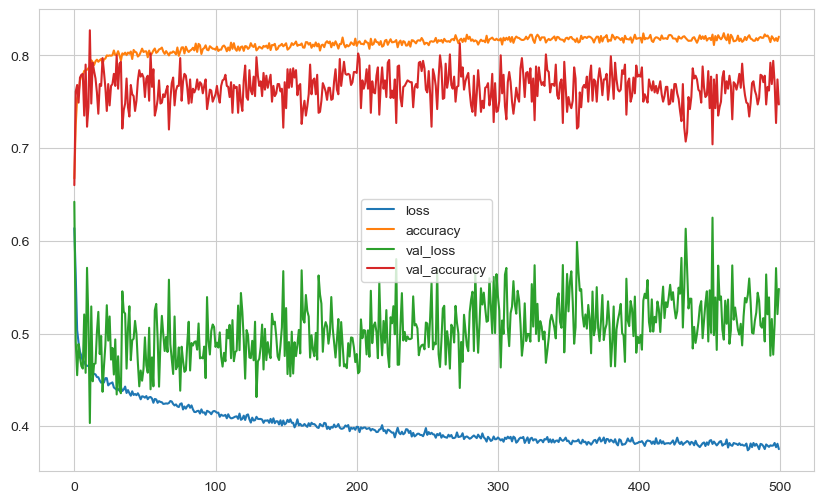

In [84]:
loss_df.plot()

    If you increase the learning rate too much, the optimization process might become unstable. The model's parameter updates could overshoot the optimal values, causing the loss error to increase. This is often referred to as "diverging" and indicates that the learning rate is too high.

In [85]:
loss, accuracy = model1.evaluate(X_test, y_test, verbose=0)
print('''
Loss is :   {}
Accuracy is {}'''.format(loss, accuracy))



Loss is :   0.46994757652282715
Accuracy is 0.7820000052452087


32/32 [==============================] - 0s 2ms/step


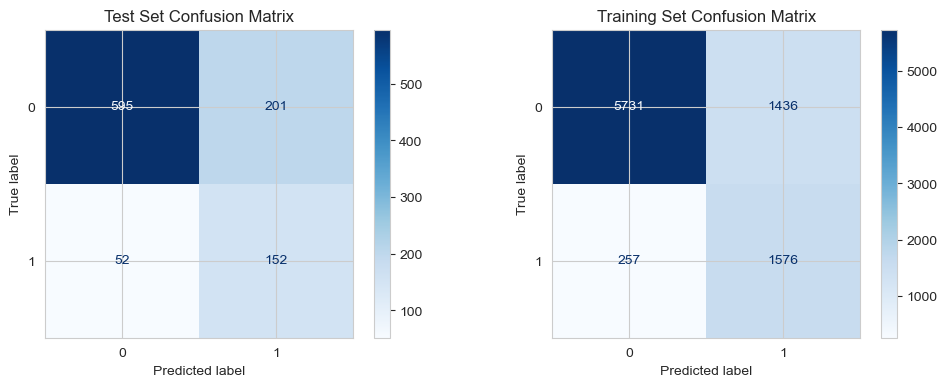


-----------------------------Train Results-----------------------------
              precision    recall  f1-score   support

           0       0.96      0.80      0.87      7167
           1       0.52      0.86      0.65      1833

    accuracy                           0.81      9000
   macro avg       0.74      0.83      0.76      9000
weighted avg       0.87      0.81      0.83      9000

                        
-----------------------------Test Results-----------------------------
              precision    recall  f1-score   support

           0       0.92      0.75      0.82       796
           1       0.43      0.75      0.55       204

    accuracy                           0.75      1000
   macro avg       0.68      0.75      0.69      1000
weighted avg       0.82      0.75      0.77      1000


-----------------------------precision_recall_curve-----------------------------


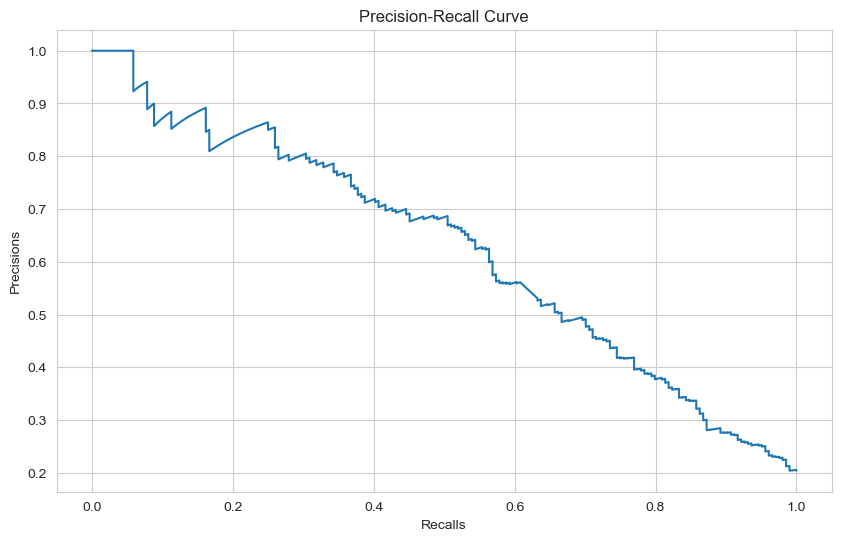

-----------------------------Receiver Operating Characteristic-----------------------------


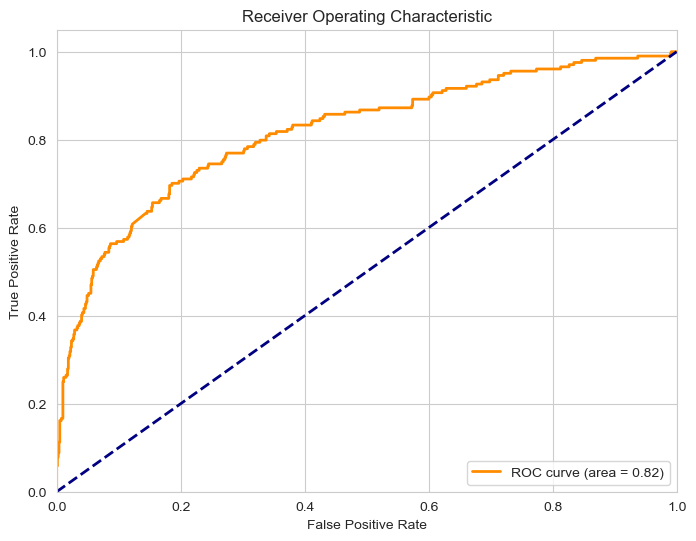

In [86]:
evaluate_classification_model(model3, X_train, y_train, X_test, y_test)


### Add Dropout Layer

In [87]:
from tensorflow.keras.layers import Dropout

In [88]:
model4 = Sequential()
model4.add(Dense(24, activation = "relu", input_dim = X_train.shape[1]))
model4.add(Dropout(0.25))# dropout layers to prevent overfitting
model4.add(Dense(12, activation = "relu"))
model4.add(Dropout(0.25))
model4.add(Dense(1, activation  = "sigmoid"))
opt = Adam(lr = 0.001) # which is the defult value for the learninig rate 
model4.compile(optimizer = opt , loss = "binary_crossentropy", metrics = ["accuracy"])


In [89]:
model4.fit(x = X_train, y = y_train, validation_data=(X_val,y_val), batch_size = 64, epochs = 500, verbose = 1, class_weight=class_weights)


Epoch 1/500
141/141 [==============================] - 1s 6ms/step - loss: 0.6863 - accuracy: 0.5849 - val_loss: 0.6670 - val_accuracy: 0.6520
Epoch 2/500
141/141 [==============================] - 0s 3ms/step - loss: 0.6630 - accuracy: 0.6246 - val_loss: 0.6463 - val_accuracy: 0.6570
Epoch 3/500
141/141 [==============================] - 1s 4ms/step - loss: 0.6483 - accuracy: 0.6454 - val_loss: 0.6168 - val_accuracy: 0.7000
Epoch 4/500
141/141 [==============================] - 0s 3ms/step - loss: 0.6376 - accuracy: 0.6659 - val_loss: 0.6155 - val_accuracy: 0.6860
Epoch 5/500
141/141 [==============================] - 1s 4ms/step - loss: 0.6311 - accuracy: 0.6670 - val_loss: 0.6459 - val_accuracy: 0.6320
Epoch 6/500
141/141 [==============================] - 1s 4ms/step - loss: 0.6184 - accuracy: 0.6778 - val_loss: 0.6041 - val_accuracy: 0.6760
Epoch 7/500
141/141 [==============================] - 1s 4ms/step - loss: 0.6096 - accuracy: 0.6831 - val_loss: 0.5912 - val_accuracy: 0.6880

Epoch 58/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4811 - accuracy: 0.7627 - val_loss: 0.4908 - val_accuracy: 0.7500
Epoch 59/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4838 - accuracy: 0.7548 - val_loss: 0.5143 - val_accuracy: 0.7280
Epoch 60/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4823 - accuracy: 0.7609 - val_loss: 0.4842 - val_accuracy: 0.7510
Epoch 61/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4828 - accuracy: 0.7544 - val_loss: 0.5013 - val_accuracy: 0.7380
Epoch 62/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4814 - accuracy: 0.7559 - val_loss: 0.5255 - val_accuracy: 0.7120
Epoch 63/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4815 - accuracy: 0.7462 - val_loss: 0.4944 - val_accuracy: 0.7430
Epoch 64/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4827 - accuracy: 0.7571 - val_loss: 0.5015 - val_accuracy:

Epoch 115/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4634 - accuracy: 0.7762 - val_loss: 0.5010 - val_accuracy: 0.7310
Epoch 116/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4655 - accuracy: 0.7741 - val_loss: 0.4820 - val_accuracy: 0.7510
Epoch 117/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4693 - accuracy: 0.7746 - val_loss: 0.4875 - val_accuracy: 0.7490
Epoch 118/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4665 - accuracy: 0.7733 - val_loss: 0.5023 - val_accuracy: 0.7360
Epoch 119/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4631 - accuracy: 0.7713 - val_loss: 0.4775 - val_accuracy: 0.7490
Epoch 120/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4653 - accuracy: 0.7723 - val_loss: 0.4899 - val_accuracy: 0.7440
Epoch 121/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4656 - accuracy: 0.7722 - val_loss: 0.4942 - val_ac

141/141 [==============================] - 0s 3ms/step - loss: 0.4587 - accuracy: 0.7853 - val_loss: 0.4865 - val_accuracy: 0.7560
Epoch 172/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4569 - accuracy: 0.7832 - val_loss: 0.4833 - val_accuracy: 0.7570
Epoch 173/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4579 - accuracy: 0.7806 - val_loss: 0.4752 - val_accuracy: 0.7540
Epoch 174/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4549 - accuracy: 0.7831 - val_loss: 0.4793 - val_accuracy: 0.7580
Epoch 175/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4595 - accuracy: 0.7794 - val_loss: 0.5114 - val_accuracy: 0.7350
Epoch 176/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4611 - accuracy: 0.7774 - val_loss: 0.4888 - val_accuracy: 0.7530
Epoch 177/500
141/141 [==============================] - 1s 4ms/step - loss: 0.4599 - accuracy: 0.7826 - val_loss: 0.4756 - val_accuracy: 0.7670

141/141 [==============================] - 0s 3ms/step - loss: 0.4570 - accuracy: 0.7801 - val_loss: 0.5049 - val_accuracy: 0.7420
Epoch 228/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4544 - accuracy: 0.7803 - val_loss: 0.4724 - val_accuracy: 0.7710
Epoch 229/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4594 - accuracy: 0.7801 - val_loss: 0.4816 - val_accuracy: 0.7620
Epoch 230/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4566 - accuracy: 0.7838 - val_loss: 0.4678 - val_accuracy: 0.7660
Epoch 231/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4521 - accuracy: 0.7876 - val_loss: 0.4855 - val_accuracy: 0.7570
Epoch 232/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4558 - accuracy: 0.7864 - val_loss: 0.4916 - val_accuracy: 0.7470
Epoch 233/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4537 - accuracy: 0.7801 - val_loss: 0.4868 - val_accuracy: 0.7490

141/141 [==============================] - 0s 3ms/step - loss: 0.4598 - accuracy: 0.7851 - val_loss: 0.4855 - val_accuracy: 0.7670
Epoch 284/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4567 - accuracy: 0.7879 - val_loss: 0.4662 - val_accuracy: 0.7770
Epoch 285/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4492 - accuracy: 0.7834 - val_loss: 0.4660 - val_accuracy: 0.7730
Epoch 286/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4529 - accuracy: 0.7844 - val_loss: 0.4778 - val_accuracy: 0.7580
Epoch 287/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4529 - accuracy: 0.7831 - val_loss: 0.4874 - val_accuracy: 0.7560
Epoch 288/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4553 - accuracy: 0.7886 - val_loss: 0.4690 - val_accuracy: 0.7690
Epoch 289/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4505 - accuracy: 0.7853 - val_loss: 0.4828 - val_accuracy: 0.7660

141/141 [==============================] - 1s 4ms/step - loss: 0.4520 - accuracy: 0.7823 - val_loss: 0.4932 - val_accuracy: 0.7490
Epoch 340/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4523 - accuracy: 0.7803 - val_loss: 0.4976 - val_accuracy: 0.7460
Epoch 341/500
141/141 [==============================] - 0s 2ms/step - loss: 0.4522 - accuracy: 0.7882 - val_loss: 0.4770 - val_accuracy: 0.7620
Epoch 342/500
141/141 [==============================] - 0s 2ms/step - loss: 0.4461 - accuracy: 0.7827 - val_loss: 0.4594 - val_accuracy: 0.7650
Epoch 343/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4544 - accuracy: 0.7852 - val_loss: 0.4699 - val_accuracy: 0.7570
Epoch 344/500
141/141 [==============================] - 1s 4ms/step - loss: 0.4559 - accuracy: 0.7856 - val_loss: 0.4948 - val_accuracy: 0.7490
Epoch 345/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4588 - accuracy: 0.7858 - val_loss: 0.4772 - val_accuracy: 0.7560

141/141 [==============================] - 0s 3ms/step - loss: 0.4563 - accuracy: 0.7852 - val_loss: 0.4926 - val_accuracy: 0.7360
Epoch 396/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4526 - accuracy: 0.7829 - val_loss: 0.4824 - val_accuracy: 0.7500
Epoch 397/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4502 - accuracy: 0.7841 - val_loss: 0.4795 - val_accuracy: 0.7510
Epoch 398/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4491 - accuracy: 0.7876 - val_loss: 0.4872 - val_accuracy: 0.7460
Epoch 399/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4478 - accuracy: 0.7854 - val_loss: 0.4624 - val_accuracy: 0.7650
Epoch 400/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4474 - accuracy: 0.7896 - val_loss: 0.4844 - val_accuracy: 0.7490
Epoch 401/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4453 - accuracy: 0.7809 - val_loss: 0.4768 - val_accuracy: 0.7570

141/141 [==============================] - 0s 3ms/step - loss: 0.4497 - accuracy: 0.7860 - val_loss: 0.4744 - val_accuracy: 0.7520
Epoch 452/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4515 - accuracy: 0.7797 - val_loss: 0.4840 - val_accuracy: 0.7480
Epoch 453/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4510 - accuracy: 0.7808 - val_loss: 0.4710 - val_accuracy: 0.7580
Epoch 454/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4535 - accuracy: 0.7833 - val_loss: 0.4938 - val_accuracy: 0.7480
Epoch 455/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4562 - accuracy: 0.7818 - val_loss: 0.4994 - val_accuracy: 0.7390
Epoch 456/500
141/141 [==============================] - 0s 3ms/step - loss: 0.4476 - accuracy: 0.7860 - val_loss: 0.4900 - val_accuracy: 0.7440
Epoch 457/500
141/141 [==============================] - 1s 4ms/step - loss: 0.4553 - accuracy: 0.7833 - val_loss: 0.4755 - val_accuracy: 0.7550

In [90]:
loss_df = pd.DataFrame(model4.history.history)
loss_df


,loss,accuracy,val_loss,val_accuracy
0,0.686,0.585,0.667,0.652
1,0.663,0.625,0.646,0.657
2,0.648,0.645,0.617,0.700
3,0.638,0.666,0.615,0.686
4,0.631,0.667,0.646,0.632
...,...,...,...,...
495,0.450,0.786,0.481,0.753
496,0.445,0.787,0.492,0.744
497,0.445,0.788,0.490,0.743
498,0.446,0.783,0.485,0.749


<Axes: >

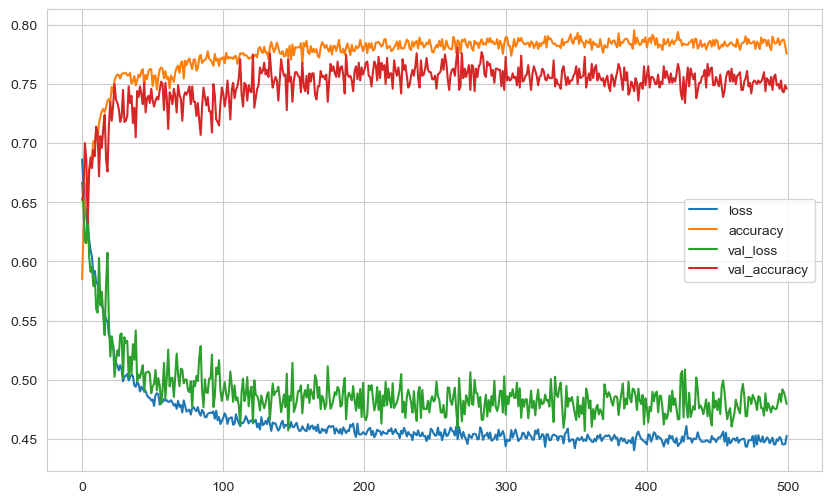

In [91]:
loss_df.plot()

In [92]:
loss, accuracy = model4.evaluate(X_test, y_test, verbose=0)
print('''
Loss is :   {}
Accuracy is {}'''.format(loss, accuracy))



Loss is :   0.47943776845932007
Accuracy is 0.7459999918937683


32/32 [==============================] - 0s 2ms/step


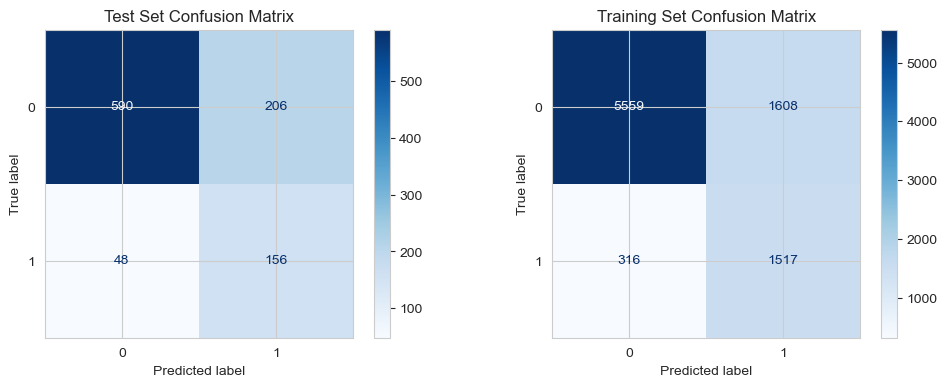


-----------------------------Train Results-----------------------------
              precision    recall  f1-score   support

           0       0.95      0.78      0.85      7167
           1       0.49      0.83      0.61      1833

    accuracy                           0.79      9000
   macro avg       0.72      0.80      0.73      9000
weighted avg       0.85      0.79      0.80      9000

                        
-----------------------------Test Results-----------------------------
              precision    recall  f1-score   support

           0       0.92      0.74      0.82       796
           1       0.43      0.76      0.55       204

    accuracy                           0.75      1000
   macro avg       0.68      0.75      0.69      1000
weighted avg       0.82      0.75      0.77      1000


-----------------------------precision_recall_curve-----------------------------


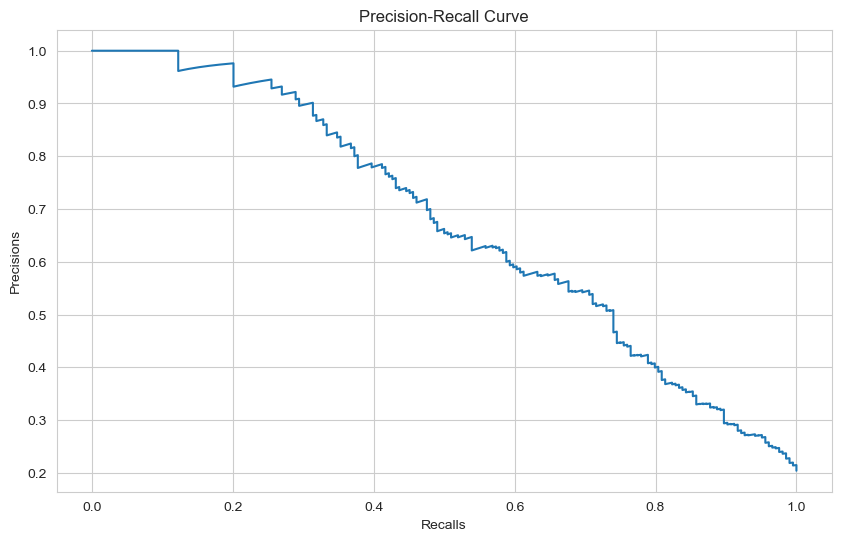

-----------------------------Receiver Operating Characteristic-----------------------------


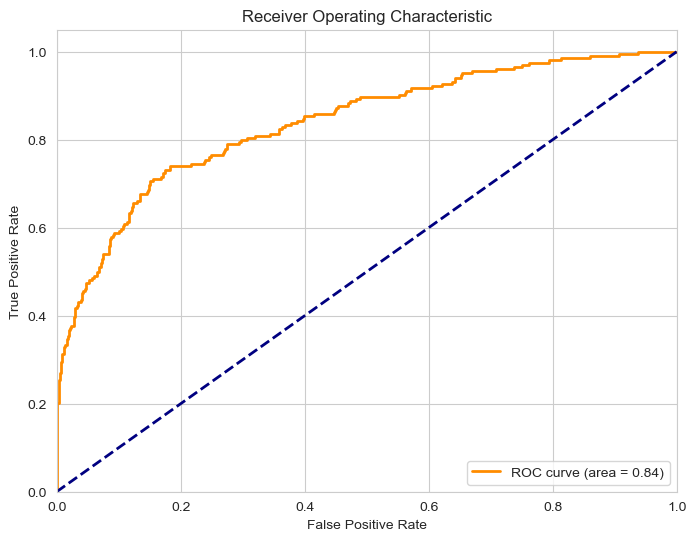

In [93]:
evaluate_classification_model(model4, X_train, y_train, X_test, y_test)

### Add Early Stop

#### Monitor the "val_loss" as metric

In [94]:
from tensorflow.keras.callbacks import EarlyStopping


In [95]:
model5 = Sequential()
model5.add(Dense(24, activation = "relu", input_dim = X_train.shape[1]))
model5.add(Dense(12, activation = "relu"))
model5.add(Dense(1, activation  = "sigmoid"))
opt = Adam(lr = 0.001) # which is the defult value for the learninig rate 
model5.compile(optimizer = opt , loss = "binary_crossentropy", metrics = ["accuracy"])


In [96]:
early_stop = EarlyStopping(
    monitor="val_loss", mode="min", verbose=1, patience=30, restore_best_weights=True
)

In [97]:
model5.fit(x=X_train, y=y_train,validation_data=(X_val,y_val), batch_size=64,verbose=1,epochs=1000,  callbacks=[early_stop], class_weight=class_weights)



Epoch 1/1000
141/141 [==============================] - 1s 4ms/step - loss: 0.6602 - accuracy: 0.5271 - val_loss: 0.5952 - val_accuracy: 0.7330
Epoch 2/1000
141/141 [==============================] - 0s 3ms/step - loss: 0.6201 - accuracy: 0.6791 - val_loss: 0.6154 - val_accuracy: 0.6740
Epoch 3/1000
141/141 [==============================] - 0s 3ms/step - loss: 0.6031 - accuracy: 0.6899 - val_loss: 0.5789 - val_accuracy: 0.7170
Epoch 4/1000
141/141 [==============================] - 0s 3ms/step - loss: 0.5859 - accuracy: 0.7028 - val_loss: 0.5786 - val_accuracy: 0.7030
Epoch 5/1000
141/141 [==============================] - 0s 3ms/step - loss: 0.5686 - accuracy: 0.7152 - val_loss: 0.6186 - val_accuracy: 0.6540
Epoch 6/1000
141/141 [==============================] - 0s 3ms/step - loss: 0.5516 - accuracy: 0.7253 - val_loss: 0.6120 - val_accuracy: 0.6690
Epoch 7/1000
141/141 [==============================] - 0s 3ms/step - loss: 0.5324 - accuracy: 0.7413 - val_loss: 0.5411 - val_accuracy:

141/141 [==============================] - 0s 3ms/step - loss: 0.4527 - accuracy: 0.7879 - val_loss: 0.5034 - val_accuracy: 0.7550
Epoch 58/1000
141/141 [==============================] - 0s 3ms/step - loss: 0.4533 - accuracy: 0.7891 - val_loss: 0.4774 - val_accuracy: 0.7720
Epoch 59/1000
141/141 [==============================] - 0s 3ms/step - loss: 0.4522 - accuracy: 0.7897 - val_loss: 0.5290 - val_accuracy: 0.7370
Epoch 60/1000
141/141 [==============================] - 0s 3ms/step - loss: 0.4528 - accuracy: 0.7906 - val_loss: 0.5071 - val_accuracy: 0.7480
Epoch 61/1000
141/141 [==============================] - 0s 3ms/step - loss: 0.4527 - accuracy: 0.7866 - val_loss: 0.4657 - val_accuracy: 0.7760
Epoch 62/1000
141/141 [==============================] - 0s 3ms/step - loss: 0.4507 - accuracy: 0.7899 - val_loss: 0.4608 - val_accuracy: 0.7830
Epoch 63/1000
141/141 [==============================] - 0s 3ms/step - loss: 0.4513 - accuracy: 0.7909 - val_loss: 0.4694 - val_accuracy: 0.7680

In [98]:
loss_df = pd.DataFrame(model5.history.history)
loss_df

,loss,accuracy,val_loss,val_accuracy
0,0.660,0.527,0.595,0.733
1,0.620,0.679,0.615,0.674
2,0.603,0.690,0.579,0.717
3,0.586,0.703,0.579,0.703
4,0.569,0.715,0.619,0.654
...,...,...,...,...
73,0.448,0.793,0.465,0.777
74,0.446,0.796,0.497,0.752
75,0.445,0.791,0.466,0.779
76,0.445,0.797,0.477,0.765


<Axes: >

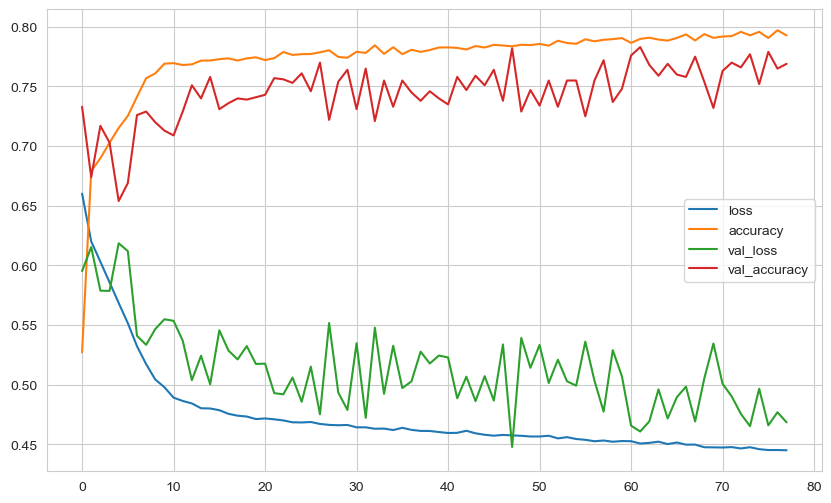

In [99]:
loss_df.plot()

32/32 [==============================] - 0s 2ms/step


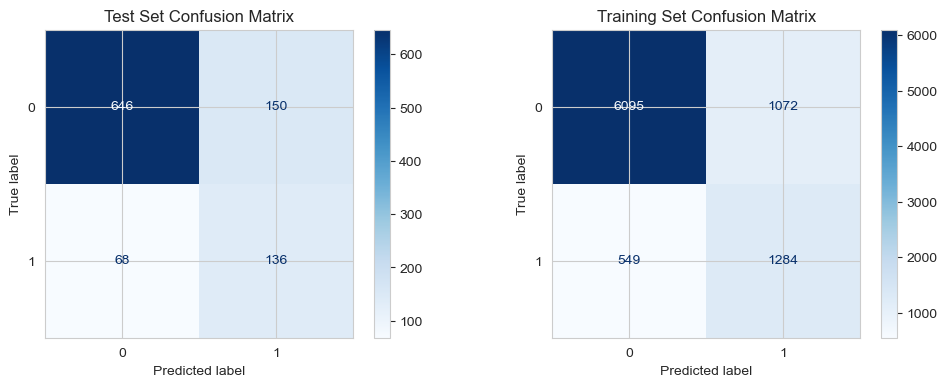


-----------------------------Train Results-----------------------------
              precision    recall  f1-score   support

           0       0.92      0.85      0.88      7167
           1       0.54      0.70      0.61      1833

    accuracy                           0.82      9000
   macro avg       0.73      0.78      0.75      9000
weighted avg       0.84      0.82      0.83      9000

                        
-----------------------------Test Results-----------------------------
              precision    recall  f1-score   support

           0       0.90      0.81      0.86       796
           1       0.48      0.67      0.56       204

    accuracy                           0.78      1000
   macro avg       0.69      0.74      0.71      1000
weighted avg       0.82      0.78      0.79      1000


-----------------------------precision_recall_curve-----------------------------


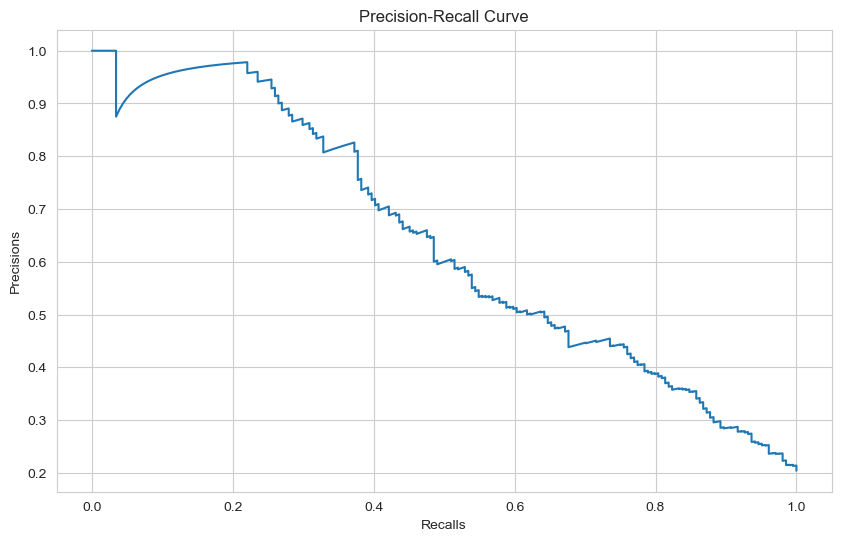

-----------------------------Receiver Operating Characteristic-----------------------------


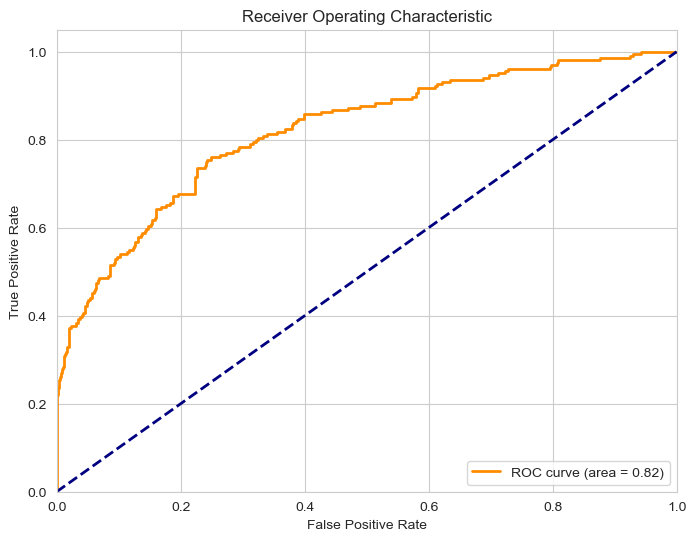

In [100]:
evaluate_classification_model(model5, X_train, y_train, X_test, y_test)


#### Monitor the "val_recall" as metric

In [101]:
model6 = Sequential()
model6.add(Dense(24, activation = "relu", input_dim = X_train.shape[1]))
model6.add(Dense(12, activation = "relu"))
model6.add(Dense(1, activation  = "sigmoid"))
opt = Adam(lr = 0.001) # which is the defult value for the learninig rate 
model6.compile(optimizer = opt , loss = "binary_crossentropy", metrics = ["accuracy"])



##### Configure EarlyStopping callback to monitor the validation accuracy during training.
- "val_accuracy" is the monitored metric (we aim to maximize accuracy).
- "mode" is set to "max" since we want to stop training when validation accuracy stops improving.
- "verbose" is set to 1 to receive messages about the early stopping process.
- "patience" is set to 25, which means training continues for up to 25 epochs without improvement.
- "restore_best_weights" is set to True, so the model's best weights are restored when training stops early.


In [102]:

early_stop = EarlyStopping(monitor="val_accuracy", mode="max",verbose=1, patience=25, restore_best_weights = True)


In [103]:
model6.fit(x=X_train, y=y_train,validation_data=(X_val,y_val), batch_size=64,verbose=1,epochs=1000,  callbacks=[early_stop], class_weight=class_weights)


Epoch 1/1000
141/141 [==============================] - 1s 4ms/step - loss: 0.6675 - accuracy: 0.6459 - val_loss: 0.6610 - val_accuracy: 0.6260
Epoch 2/1000
141/141 [==============================] - 0s 3ms/step - loss: 0.6345 - accuracy: 0.6598 - val_loss: 0.6386 - val_accuracy: 0.6620
Epoch 3/1000
141/141 [==============================] - 0s 3ms/step - loss: 0.6181 - accuracy: 0.6684 - val_loss: 0.6351 - val_accuracy: 0.6470
Epoch 4/1000
141/141 [==============================] - 0s 3ms/step - loss: 0.6031 - accuracy: 0.6798 - val_loss: 0.6224 - val_accuracy: 0.6580
Epoch 5/1000
141/141 [==============================] - 0s 3ms/step - loss: 0.5898 - accuracy: 0.6939 - val_loss: 0.6587 - val_accuracy: 0.6180
Epoch 6/1000
141/141 [==============================] - 0s 3ms/step - loss: 0.5767 - accuracy: 0.6994 - val_loss: 0.6017 - val_accuracy: 0.6680
Epoch 7/1000
141/141 [==============================] - 0s 3ms/step - loss: 0.5604 - accuracy: 0.7143 - val_loss: 0.5676 - val_accuracy:

141/141 [==============================] - 0s 2ms/step - loss: 0.4527 - accuracy: 0.7882 - val_loss: 0.5439 - val_accuracy: 0.7260
Epoch 58/1000
141/141 [==============================] - 0s 3ms/step - loss: 0.4532 - accuracy: 0.7887 - val_loss: 0.5342 - val_accuracy: 0.7230
Epoch 59/1000
141/141 [==============================] - 0s 3ms/step - loss: 0.4526 - accuracy: 0.7862 - val_loss: 0.4909 - val_accuracy: 0.7510
Epoch 59: early stopping


In [104]:
loss_df = pd.DataFrame(model6.history.history)
loss_df.head()


,loss,accuracy,val_loss,val_accuracy
0,0.668,0.646,0.661,0.626
1,0.634,0.660,0.639,0.662
2,0.618,0.668,0.635,0.647
3,0.603,0.680,0.622,0.658
4,0.590,0.694,0.659,0.618


<Axes: >

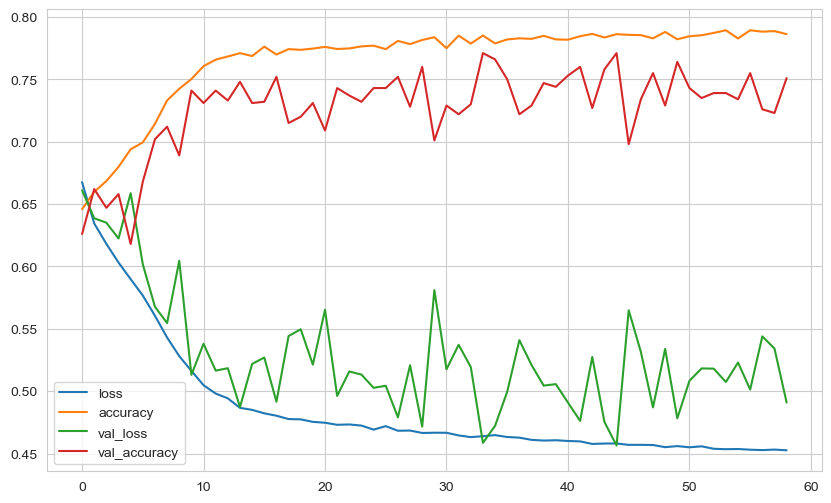

In [105]:
loss_df.plot()

In [106]:
loss, accuracy = model6.evaluate(X_test, y_test, verbose=0)
print('''
Loss is :   {}
Accuracy is {}'''.format(loss, accuracy))


Loss is :   0.4585270583629608
Accuracy is 0.7710000276565552


32/32 [==============================] - 0s 2ms/step


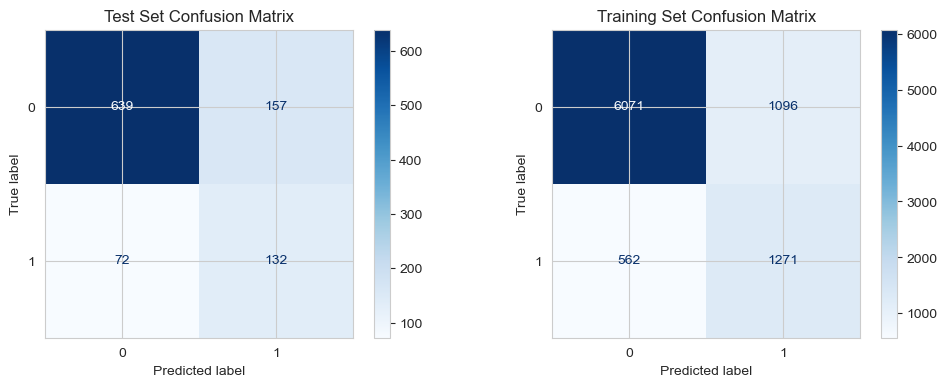


-----------------------------Train Results-----------------------------
              precision    recall  f1-score   support

           0       0.92      0.85      0.88      7167
           1       0.54      0.69      0.61      1833

    accuracy                           0.82      9000
   macro avg       0.73      0.77      0.74      9000
weighted avg       0.84      0.82      0.82      9000

                        
-----------------------------Test Results-----------------------------
              precision    recall  f1-score   support

           0       0.90      0.80      0.85       796
           1       0.46      0.65      0.54       204

    accuracy                           0.77      1000
   macro avg       0.68      0.72      0.69      1000
weighted avg       0.81      0.77      0.78      1000


-----------------------------precision_recall_curve-----------------------------


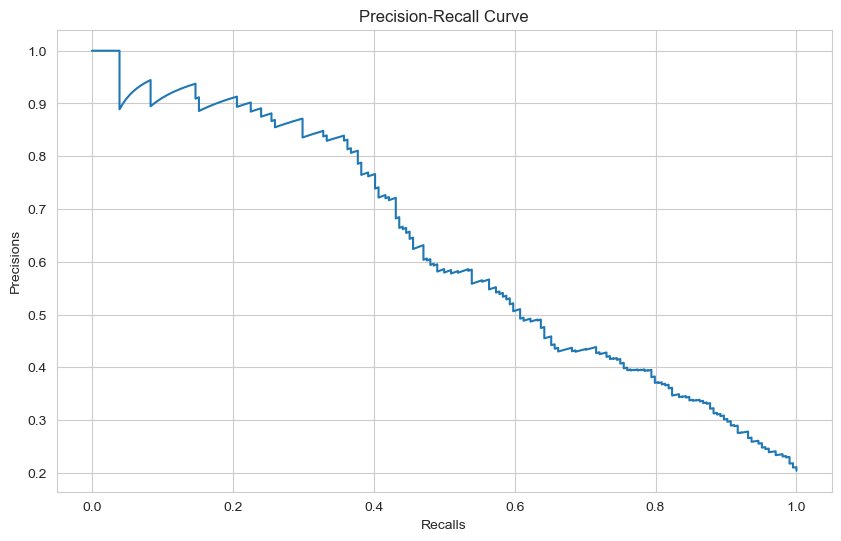

-----------------------------Receiver Operating Characteristic-----------------------------


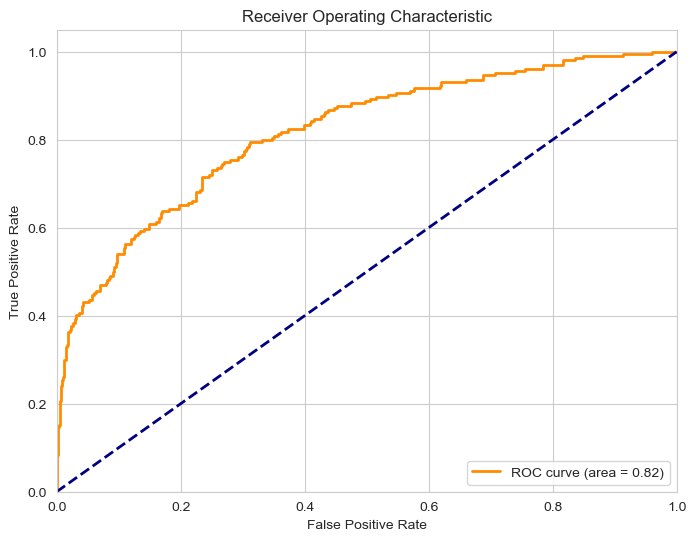

In [107]:
evaluate_classification_model(model6, X_train, y_train, X_test, y_test)


## Optuna

In [110]:
import optuna # Optuna is used for optimizing hyperparameters, and the TensorFlow optimizers will be used during model training.
from tensorflow.keras.optimizers.legacy import Adam, Adadelta, RMSprop, Nadam

##### Function create_model(trial) defines a neural network model with hyperparameters to optimize.
 - Hyperparameters include the number of units in two hidden layers, the choice of optimizer, and learning rate.
 - It also sets random seed for reproducibility.
 - The model architecture consists of two hidden layers, each with dropout for regularization.
 - The model is compiled with the specified optimizer and learning rate.

##### Function objective(trial) is used as the objective function for Optuna's hyperparameter optimization.
 - It creates a model using create_model(trial) and fits it to the training data.
 - Class weights are set based on trial-suggested values for class 0 and class 1.
 - The model is trained for a fixed number of epochs with early stopping.
 - The function returns the accuracy score on the validation data, which Optuna aims to maximize.

In [111]:

def create_model(trial):
    # Some hyperparameters we want to optimize
    n_units1 = trial.suggest_int("n_units1", 8, 128)
    n_units2 = trial.suggest_int("n_units2", 8, 128)
    optimizer = trial.suggest_categorical("optimizer", [Adam, Adadelta, RMSprop, Nadam])
    learning_rate = trial.suggest_loguniform("learning_rate", 0.001,0.005)

    tf.random.set_seed(13)
    model = Sequential()
    model.add(Dense(n_units1, input_dim=X_train.shape[1], activation="relu"))
    model.add(Dropout(0.25))
    model.add(Dense(n_units2, activation="relu"))
    model.add(Dropout(0.25))
    model.add(Dense(1, activation="sigmoid"))
    model.compile(
        loss="binary_crossentropy",
        optimizer=optimizer(learning_rate=learning_rate),
        metrics=['accuracy'],
    )
    return model


def objective(trial):
    model = create_model(trial)
    w0 = trial.suggest_loguniform("w0", 0.01, 5)
    w1 = trial.suggest_loguniform("w1", 0.01, 5)
    model.fit(
        X_train,
        y_train,
        validation_data=(X_val,y_val),
        batch_size=64,
        epochs=100,
        callbacks=[early_stop],
        class_weight={0: w0, 1: w1},
        verbose=0,
    )
    score = model.evaluate(X_test, y_test, verbose=0)[1]
    return score




In [112]:
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=10)
study.best_params
# This code sets up an Optuna study for hyperparameter optimization, runs the optimization process with a specified number of trials,
# and retrieves the best set of hyperparameters based on the objective function's maximization.


[I 2023-10-30 01:57:53,419] A new study created in memory with name: no-name-2d87dfdb-b115-4d32-9dae-90f589c6e2d3


Restoring model weights from the end of the best epoch: 1.
Epoch 26: early stopping


[I 2023-10-30 01:58:06,315] Trial 0 finished with value: 0.6710000038146973 and parameters: {'n_units1': 85, 'n_units2': 113, 'optimizer': <class 'keras.src.optimizers.legacy.adadelta.Adadelta'>, 'learning_rate': 0.0019815209843915393, 'w0': 0.03299081284878304, 'w1': 1.1405456467701691}. Best is trial 0 with value: 0.6710000038146973.


Restoring model weights from the end of the best epoch: 40.
Epoch 65: early stopping


[I 2023-10-30 01:58:32,457] Trial 1 finished with value: 0.8040000200271606 and parameters: {'n_units1': 37, 'n_units2': 39, 'optimizer': <class 'keras.src.optimizers.legacy.rmsprop.RMSprop'>, 'learning_rate': 0.0013050627263760204, 'w0': 0.014962035653512673, 'w1': 0.05460895642799652}. Best is trial 1 with value: 0.8040000200271606.


Restoring model weights from the end of the best epoch: 27.
Epoch 52: early stopping


[I 2023-10-30 01:58:54,116] Trial 2 finished with value: 0.8140000104904175 and parameters: {'n_units1': 61, 'n_units2': 39, 'optimizer': <class 'keras.src.optimizers.legacy.rmsprop.RMSprop'>, 'learning_rate': 0.0011088636383666415, 'w0': 0.07627274133536074, 'w1': 0.22870593824233984}. Best is trial 2 with value: 0.8140000104904175.
[I 2023-10-30 01:59:42,739] Trial 3 finished with value: 0.8190000057220459 and parameters: {'n_units1': 114, 'n_units2': 61, 'optimizer': <class 'keras.src.optimizers.legacy.nadam.Nadam'>, 'learning_rate': 0.002137167423901052, 'w0': 4.75199061616127, 'w1': 0.13252341557524988}. Best is trial 3 with value: 0.8190000057220459.
[I 2023-10-30 02:00:31,922] Trial 4 finished with value: 0.7910000085830688 and parameters: {'n_units1': 126, 'n_units2': 91, 'optimizer': <class 'keras.src.optimizers.legacy.adadelta.Adadelta'>, 'learning_rate': 0.001089706639042645, 'w0': 0.06892467251044976, 'w1': 0.22446675882203204}. Best is trial 3 with value: 0.819000005722045

Restoring model weights from the end of the best epoch: 12.
Epoch 37: early stopping


[I 2023-10-30 02:01:34,591] Trial 6 finished with value: 0.8489999771118164 and parameters: {'n_units1': 33, 'n_units2': 112, 'optimizer': <class 'keras.src.optimizers.legacy.adam.Adam'>, 'learning_rate': 0.001369559588166804, 'w0': 0.6063222273382722, 'w1': 0.6189054028396654}. Best is trial 6 with value: 0.8489999771118164.


Restoring model weights from the end of the best epoch: 21.
Epoch 46: early stopping


[I 2023-10-30 02:01:56,596] Trial 7 finished with value: 0.8500000238418579 and parameters: {'n_units1': 85, 'n_units2': 115, 'optimizer': <class 'keras.src.optimizers.legacy.rmsprop.RMSprop'>, 'learning_rate': 0.0018558410330129628, 'w0': 1.2666895048716895, 'w1': 2.07317743245807}. Best is trial 7 with value: 0.8500000238418579.


Restoring model weights from the end of the best epoch: 12.
Epoch 37: early stopping


[I 2023-10-30 02:02:15,685] Trial 8 finished with value: 0.8349999785423279 and parameters: {'n_units1': 49, 'n_units2': 100, 'optimizer': <class 'keras.src.optimizers.legacy.nadam.Nadam'>, 'learning_rate': 0.0015857808526733718, 'w0': 0.03140569246428977, 'w1': 0.07695250169293621}. Best is trial 7 with value: 0.8500000238418579.


Restoring model weights from the end of the best epoch: 18.
Epoch 43: early stopping


[I 2023-10-30 02:02:35,455] Trial 9 finished with value: 0.8550000190734863 and parameters: {'n_units1': 14, 'n_units2': 86, 'optimizer': <class 'keras.src.optimizers.legacy.adam.Adam'>, 'learning_rate': 0.0023933220461176273, 'w0': 0.49253926352890987, 'w1': 0.23710161579439587}. Best is trial 9 with value: 0.8550000190734863.


{'n_units1': 14,
 'n_units2': 86,
 'optimizer': keras.src.optimizers.legacy.adam.Adam,
 'learning_rate': 0.0023933220461176273,
 'w0': 0.49253926352890987,
 'w1': 0.23710161579439587}

# when we foucs on recall
    {'n_units1': 53,
    'n_units2': 87,
    'optimizer': keras.optimizers.legacy.adadelta.Adadelta,
    'learning_rate': 0.0012305475296829848,
    'w0': 0.04255627050629869,
    'w1': 2.628890627298384}

In [113]:
study.best_params

{'n_units1': 14,
 'n_units2': 86,
 'optimizer': keras.src.optimizers.legacy.adam.Adam,
 'learning_rate': 0.0023933220461176273,
 'w0': 0.49253926352890987,
 'w1': 0.23710161579439587}

In [114]:
# build model with optuna parameters
unit1, unit2, optimizer, lr, w0, w1 = (
    study.best_params["n_units1"],
    study.best_params["n_units2"],
    study.best_params["optimizer"],
    study.best_params["learning_rate"],
    study.best_params["w0"],
    study.best_params["w1"],
)
# Extract the best hyperparameters obtained from the Optuna study for model construction.
# These parameters include the number of units in the two hidden layers, the chosen optimizer, learning rate, and class weights.

tf.random.set_seed(13)
model = Sequential()
model.add(Dense(unit1, activation="relu"))
model.add(Dropout(0.25))
model.add(Dense(unit2, activation="relu"))
model.add(Dropout(0.25))
model.add(Dense(1, activation="sigmoid"))
opt = optimizer(learning_rate=lr)
model.compile(optimizer=opt, loss="binary_crossentropy", metrics=["accuracy"])



In [115]:
model.fit(X_train,y_train,validation_data=(X_val,y_val),batch_size=64,epochs=1000,callbacks=[early_stop],verbose=1)

Epoch 1/1000
141/141 [==============================] - 1s 4ms/step - loss: 0.4913 - accuracy: 0.7932 - val_loss: 0.4602 - val_accuracy: 0.7960
Epoch 2/1000
141/141 [==============================] - 0s 3ms/step - loss: 0.4601 - accuracy: 0.7988 - val_loss: 0.4533 - val_accuracy: 0.8000
Epoch 3/1000
141/141 [==============================] - 0s 3ms/step - loss: 0.4520 - accuracy: 0.8060 - val_loss: 0.4459 - val_accuracy: 0.7980
Epoch 4/1000
141/141 [==============================] - 0s 3ms/step - loss: 0.4441 - accuracy: 0.8060 - val_loss: 0.4334 - val_accuracy: 0.8190
Epoch 5/1000
141/141 [==============================] - 0s 3ms/step - loss: 0.4382 - accuracy: 0.8090 - val_loss: 0.4367 - val_accuracy: 0.8240
Epoch 6/1000
141/141 [==============================] - 0s 3ms/step - loss: 0.4315 - accuracy: 0.8186 - val_loss: 0.4233 - val_accuracy: 0.8310
Epoch 7/1000
141/141 [==============================] - 0s 3ms/step - loss: 0.4241 - accuracy: 0.8200 - val_loss: 0.4204 - val_accuracy:

### Evaluate The Model

- Plot the model history to observe the changing of metrics
- Make prediction to see "confusion matrix" and "classification report"
- Check ROC (Receiver Operating Curve) and AUC (Area Under Curve) for the model

### Trying for Recall in the metric 

In [116]:
# loss_df = pd.DataFrame(model.history.history)
# loss_df.head()

In [117]:
# loss_df.plot()

In [118]:
# loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
# print('''
# Loss is :   {}
# Accuracy is {}'''.format(loss, accuracy))

In [119]:
# evaluate_classification_model(model, X_train, y_train, X_test, y_test)


# Using accuracy for Metric

In [120]:
loss_df = pd.DataFrame(model.history.history)
loss_df.head()



,loss,accuracy,val_loss,val_accuracy
0,0.491,0.793,0.460,0.796
1,0.460,0.799,0.453,0.800
2,0.452,0.806,0.446,0.798
3,0.444,0.806,0.433,0.819
4,0.438,0.809,0.437,0.824


<Axes: >

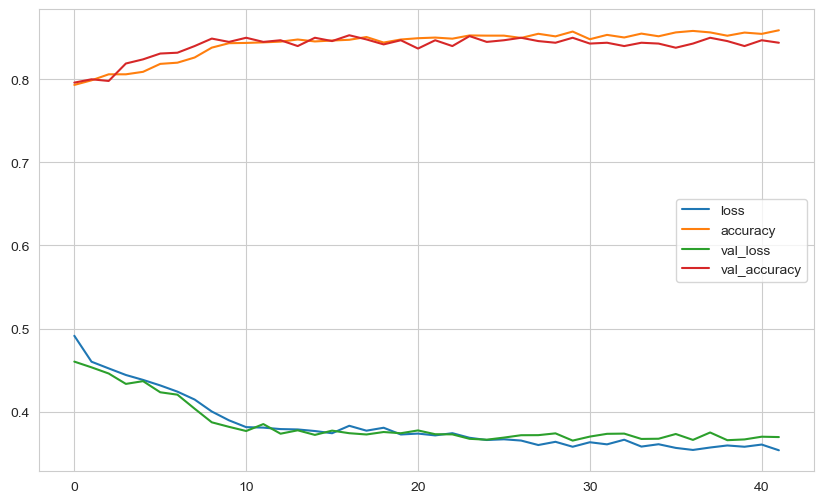

In [121]:
loss_df.plot()

In [122]:
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
print('''
Loss is :   {}
Accuracy is {}'''.format(loss, accuracy))


Loss is :   0.37402623891830444
Accuracy is 0.8529999852180481


32/32 [==============================] - 0s 1ms/step


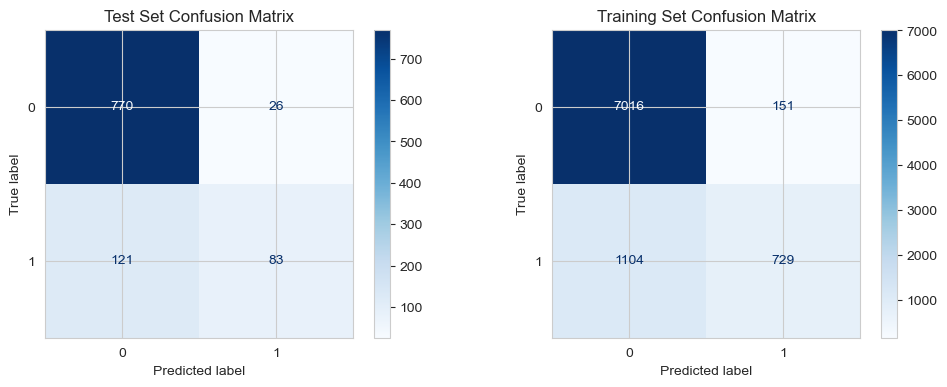


-----------------------------Train Results-----------------------------
              precision    recall  f1-score   support

           0       0.86      0.98      0.92      7167
           1       0.83      0.40      0.54      1833

    accuracy                           0.86      9000
   macro avg       0.85      0.69      0.73      9000
weighted avg       0.86      0.86      0.84      9000

                        
-----------------------------Test Results-----------------------------
              precision    recall  f1-score   support

           0       0.86      0.97      0.91       796
           1       0.76      0.41      0.53       204

    accuracy                           0.85      1000
   macro avg       0.81      0.69      0.72      1000
weighted avg       0.84      0.85      0.83      1000


-----------------------------precision_recall_curve-----------------------------


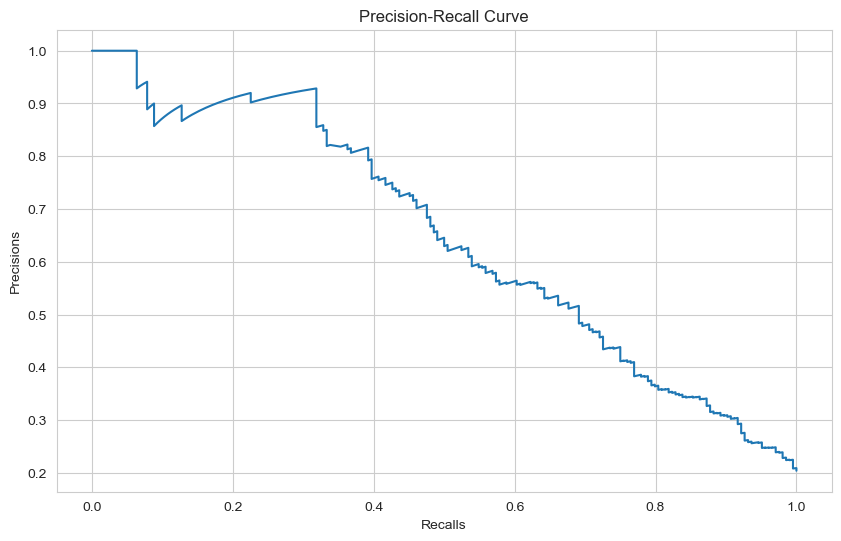

-----------------------------Receiver Operating Characteristic-----------------------------


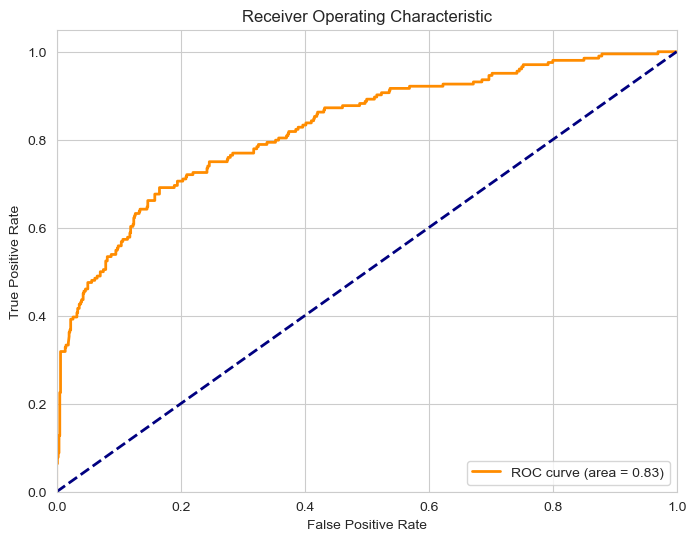

In [123]:
evaluate_classification_model(model, X_train, y_train, X_test, y_test)


# Final Model and Model Deployment and perdiction

In [124]:
import pickle
pickle.dump(Scaler, open("scaler_churn", "wb"))
# Save the data scaler (Scaler) to a file named "scaler_churn" using the Pickle module.
# This allows you to persist the scaler for later use in data preprocessing or transformations.


In [125]:
model.save('model_churn.h5') # Best one 
# Save the trained model to a file named "model_churn.h5" using the model's save method.
# This allows you to persist the model for later use in predictions or further training.



In [126]:
model.input_shape

(None, 12)

In [127]:
from tensorflow.keras.models import load_model
model_churn = load_model('model_churn.h5')
scaler_churn = pickle.load(open("scaler_churn", "rb"))
# Load a trained model (model_churn) and a data scaler (scaler_churn) from their respective files.
# The model is loaded using Keras' load_model function, and the scaler is loaded using Pickle.
# This prepares the model and scaler for making predictions or further data preprocessing.


In [128]:
churn = df.drop('Exited', axis = 1).iloc[13:14, :]
churn

,CreditScore,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Geography_France,Geography_Germany,Geography_Spain
13,549,0,25,5,0,2,0,0,190857,1,0,0


In [129]:
churn = scaler_churn.transform(churn) 
churn

array([[0.398     , 0.        , 0.09459459, 0.5       , 0.        ,
        0.33333333, 0.        , 0.        , 0.95432066, 1.        ,
        0.        , 0.        ]])

In [130]:
(model_churn.predict(churn) > 0.5).astype("int32")


1/1 [==============================] - 0s 58ms/step


array([[0]])

In [131]:
df["Exited"].iloc[13:14]

13    0
Name: Exited, dtype: int32

## trying 

In [132]:
from sklearn.linear_model import LogisticRegression

In [133]:
log_model = LogisticRegression()
log_model.fit(X_train, y_train)
y_pred = log_model.predict(X_test)
y_train_pred=log_model.predict(X_train)

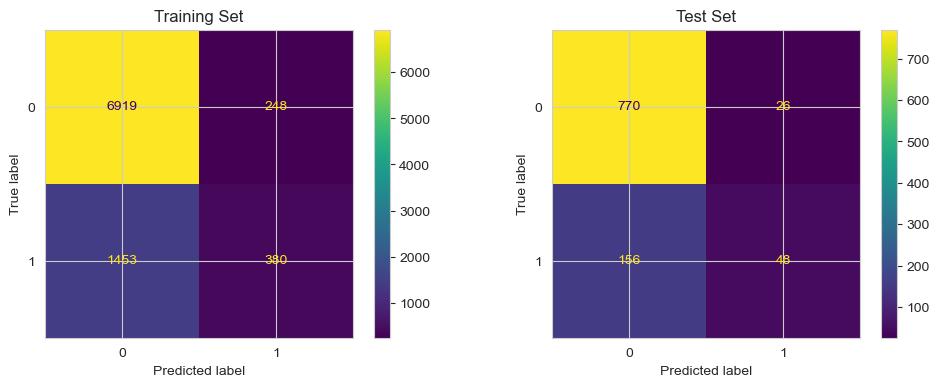


-----------------------------Train Results-----------------------------
              precision    recall  f1-score   support

           0       0.83      0.97      0.89      7167
           1       0.61      0.21      0.31      1833

    accuracy                           0.81      9000
   macro avg       0.72      0.59      0.60      9000
weighted avg       0.78      0.81      0.77      9000

                        
-----------------------------Test Results-----------------------------
              precision    recall  f1-score   support

           0       0.83      0.97      0.89       796
           1       0.65      0.24      0.35       204

    accuracy                           0.82      1000
   macro avg       0.74      0.60      0.62      1000
weighted avg       0.79      0.82      0.78      1000



In [134]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

disp_train = ConfusionMatrixDisplay.from_estimator(log_model, X_train, y_train, ax=axes[0])
disp_train.ax_.set_title('Training Set')

disp_test = ConfusionMatrixDisplay.from_estimator(log_model, X_test, y_test, ax=axes[1])
disp_test.ax_.set_title('Test Set')

plt.show()

print(f'''
-----------------------------Train Results-----------------------------
{classification_report(y_train, y_train_pred)}
                        
-----------------------------Test Results-----------------------------
{classification_report(y_test, y_pred)}''')